# Final Project Kelompok 7 : E-Commerce Shipping Data

<b> Data set yang digunakan merupakan dataset dari sebuah perusahaan e-commerce internasional yang ingin mengetahui key insight dari database konsumen. </b>

[ https://www.kaggle.com/datasets/prachi13/customer-analytics ]

Content
Dataset ini terdari dari 10999 observations dari 12 variable.
    
Dataset ini memiliki informasi sebagai berikut:

- <b>ID</b> : Nomor ID Pelanggan.
- <b>Warehouse block</b> : Perusahaan memiliki Gudang besar yang terbagi menjadi blok-blok seperti A,B,C,D,E.
- <b>Mode of shipment</b> :Perusahaan mengirimkan produk dengan berbagai cara seperti Ship, Flight, dan Road.
- <b>Customer care calls</b> : Jumlah panggilan yang dilakukan dari penyelidikan untuk penyelidikan kiriman.
- <b>Customer rating</b> : Perusahaan telah menilai dari setiap pelanggan. 1 adalah yang terendah (Terburuk), 5 adalah yang tertinggi (Terbaik).
- <b>Cost of the product</b> : Biaya Produk dalam Dolar AS.
- <b>Prior purchase</b> : Jumlah Pembelian Sebelumnya.
- <b>Product importance</b> : Perusahaan telah mengkategorikan produk dalam berbagai parameter seperti rendah, sedang, tinggi.
- <b>Gender</b> : Pria dan Wanita.
- <b>Discount offered</b> : Diskon yang ditawarkan untuk produk tertentu itu.
- <b>Weight in gms</b> : Ini adalah berat dalam gram.
- <b>Reached on time</b> : Ini adalah variabel target, di mana 1 Menunjukkan bahwa produk TIDAK tercapai tepat waktu dan 0 menunjukkan telah tercapai tepat waktu.


# <b>Stage 1</b>

In [1]:
# Load dataset dan lihat isi dari kolom
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.patches import Patch
from matplotlib.lines import Line2D
sns.set_theme(palette='summer', style='darkgrid')

In [2]:
df = pd.read_csv('Train.csv')
df.head()

,ID,Warehouse_block,Mode_of_Shipment,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Gender,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N
0,1,D,Flight,4,2,177,3,low,F,44,1233,1
1,2,F,Flight,4,5,216,2,low,M,59,3088,1
2,3,A,Flight,2,2,183,4,low,M,48,3374,1
3,4,B,Flight,3,3,176,4,medium,M,10,1177,1
4,5,C,Flight,2,2,184,3,medium,F,46,2484,1


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10999 entries, 0 to 10998
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   ID                   10999 non-null  int64 
 1   Warehouse_block      10999 non-null  object
 2   Mode_of_Shipment     10999 non-null  object
 3   Customer_care_calls  10999 non-null  int64 
 4   Customer_rating      10999 non-null  int64 
 5   Cost_of_the_Product  10999 non-null  int64 
 6   Prior_purchases      10999 non-null  int64 
 7   Product_importance   10999 non-null  object
 8   Gender               10999 non-null  object
 9   Discount_offered     10999 non-null  int64 
 10  Weight_in_gms        10999 non-null  int64 
 11  Reached.on.Time_Y.N  10999 non-null  int64 
dtypes: int64(8), object(4)
memory usage: 1.0+ MB


In [4]:
# melihat apakah ada kolom kosong atau tidak
df.isnull().sum()

ID                     0
Warehouse_block        0
Mode_of_Shipment       0
Customer_care_calls    0
Customer_rating        0
Cost_of_the_Product    0
Prior_purchases        0
Product_importance     0
Gender                 0
Discount_offered       0
Weight_in_gms          0
Reached.on.Time_Y.N    0
dtype: int64

In [5]:
# melihat jumlah baris dan jumlah kolom dari dataset
df.shape

(10999, 12)

In [6]:
cats = ['Warehouse_block', 'Mode_of_Shipment', 'Product_importance', 'Gender', 'Reached.on.Time_Y.N']
nums = ['Customer_care_calls', 'Customer_rating', 'Cost_of_the_Product', 'Prior_purchases', 'Discount_offered','Weight_in_gms']

In [7]:
# melihat gambaran umum statistik deskriptif dari data
df.describe()

,ID,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N
count,10999.00000,10999.000000,10999.000000,10999.000000,10999.000000,10999.000000,10999.000000,10999.000000
mean,5500.00000,4.054459,2.990545,210.196836,3.567597,13.373216,3634.016729,0.596691
std,3175.28214,1.141490,1.413603,48.063272,1.522860,16.205527,1635.377251,0.490584
min,1.00000,2.000000,1.000000,96.000000,2.000000,1.000000,1001.000000,0.000000
25%,2750.50000,3.000000,2.000000,169.000000,3.000000,4.000000,1839.500000,0.000000
50%,5500.00000,4.000000,3.000000,214.000000,3.000000,7.000000,4149.000000,1.000000
75%,8249.50000,5.000000,4.000000,251.000000,4.000000,10.000000,5050.000000,1.000000
max,10999.00000,7.000000,5.000000,310.000000,10.000000,65.000000,7846.000000,1.000000


## 1. Descriptive Statistic

<b>A. Apakah ada kolom dengan tipe data kurang sesuai, atau nama kolom dan isinya kurang sesuai?</b>
- Semua tipe data sudah sesuai

<b>B. Apakah ada kolom yang memiliki nilai kosong? Jika ada, apa saja?</b>
- tidak ada kolom yang memiliki nilai kosong

<b>C. Apakah ada kolom yang memiliki nilai summary agak aneh? (min/mean/median/max/unique/top/freq)</b>
- kolom prior_purchase memiliki keanehan karena nilai Q1 dan Q2 memiliki nilai yang sama jadi memungkinkan kolom tersebut ada nilai yang mendominasi.
- kolom Discount_offered memiliki keanehan karena mean > median jadi memungkinkan kolom tersebut right skewed dan memiliki outliers.
- kolom Weight_in_gms memiliki keanehan karena nilai mean < median jadi memungkinkan kolom tersebut memiliki left skew dan memiliki outliers.

## 2. Univariate Analysis

### Univariate Analysis pada Kolom Kategorikal

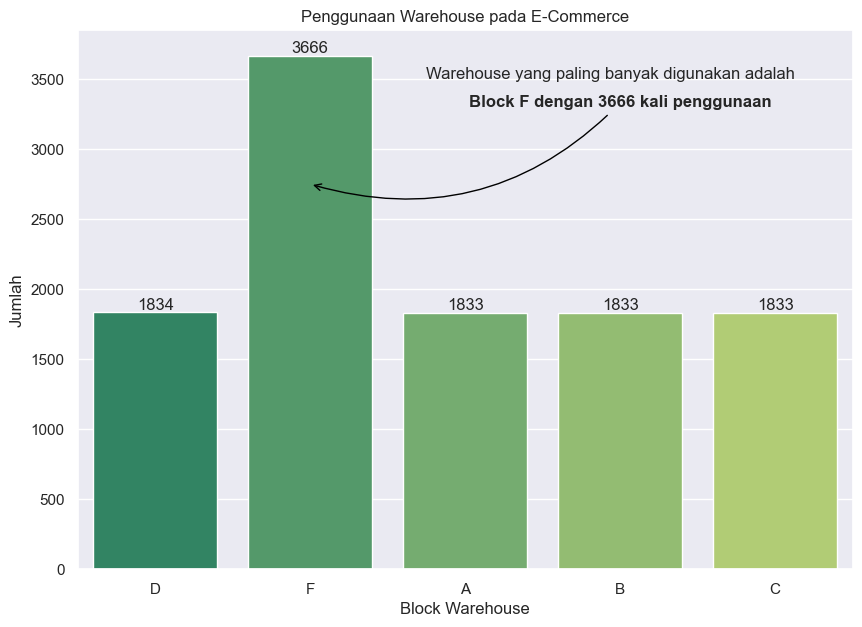

In [8]:
plt.figure(figsize = (10,7))
ax = sns.countplot(data=df, x='Warehouse_block')
plt.title('Penggunaan Warehouse pada E-Commerce')
plt.xlabel('Block Warehouse')
plt.ylabel('Jumlah')
plt.annotate('Warehouse yang paling banyak digunakan adalah', 
            xy=(1.75, 3500),fontsize=12)
plt.annotate('Block F dengan 3666 kali penggunaan',xy=(1, 2750), xytext=(3, 3300), arrowprops=dict(color='black',arrowstyle="->",connectionstyle="arc3,rad=-.3"),fontsize=12, fontweight='bold',ha='center')
for i in ax.containers:
    ax.bar_label(i,)
plt.show()

In [9]:
pip install matplotlib --upgrade


     ---------------------------------------- 7.6/7.6 MB 2.0 MB/s eta 0:00:00
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.7.0
    Uninstalling matplotlib-3.7.0:
      Successfully uninstalled matplotlib-3.7.0


ERROR: Could not install packages due to an OSError: [WinError 5] Access is denied: 'E:\\Anaconda\\Lib\\site-packages\\~atplotlib.libs\\concrt140.dll'
Consider using the `--user` option or check the permissions.



C:\Users\Gloria Yoland S\AppData\Local\Temp\ipykernel_91556\4292286123.py:9: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  plt.annotate('Kapal',xy=(0, 2750), xytext=(1.5, 3500), arrowprops=dict(color="black",facecolor='steelblue',arrowstyle="->",connectionstyle="arc3,rad=-.3"),fontsize=16, fontweight='bold',ha='center')


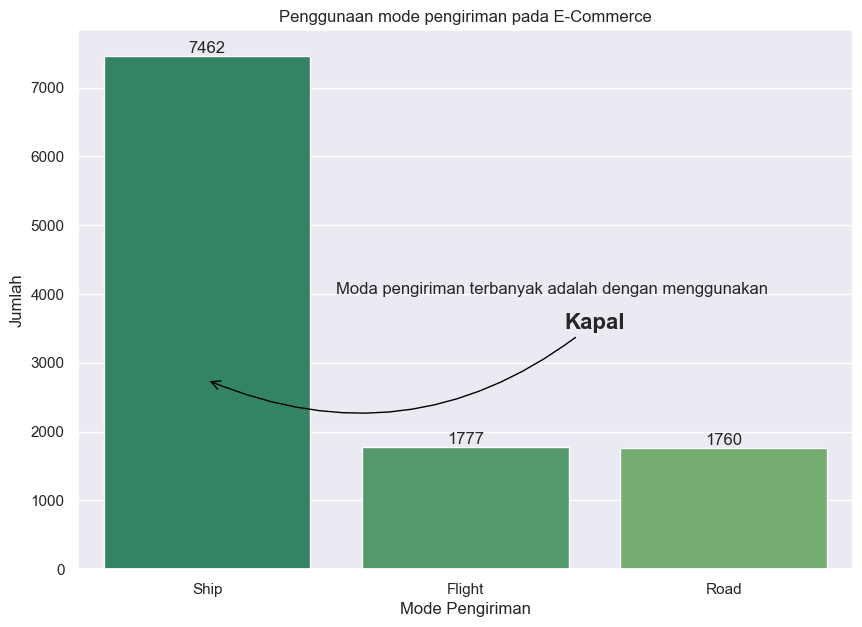

In [10]:
plt.figure(figsize = (10,7))
df_grouped = df.groupby('Mode_of_Shipment')['ID'].nunique().reset_index(name='ID').sort_values(by='ID', ascending=False)
ax = sns.barplot(data=df_grouped, x='Mode_of_Shipment',y='ID')
plt.title('Penggunaan mode pengiriman pada E-Commerce')
plt.xlabel('Mode Pengiriman')
plt.ylabel('Jumlah')
plt.annotate('Moda pengiriman terbanyak adalah dengan menggunakan ', 
            xy=(0.5, 4000),fontsize=12)
plt.annotate('Kapal',xy=(0, 2750), xytext=(1.5, 3500), arrowprops=dict(color="black",facecolor='steelblue',arrowstyle="->",connectionstyle="arc3,rad=-.3"),fontsize=16, fontweight='bold',ha='center')

for i in ax.containers:
    ax.bar_label(i,)

plt.show()

C:\Users\Gloria Yoland S\AppData\Local\Temp\ipykernel_91556\3506660606.py:11: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  plt.annotate('Low',xy=(0, 2750), xytext=(1.5, 6000), arrowprops=dict(color="black",facecolor='steelblue',arrowstyle="->",connectionstyle="arc3,rad=0.3"),fontsize=12,ha='center',fontweight='bold')


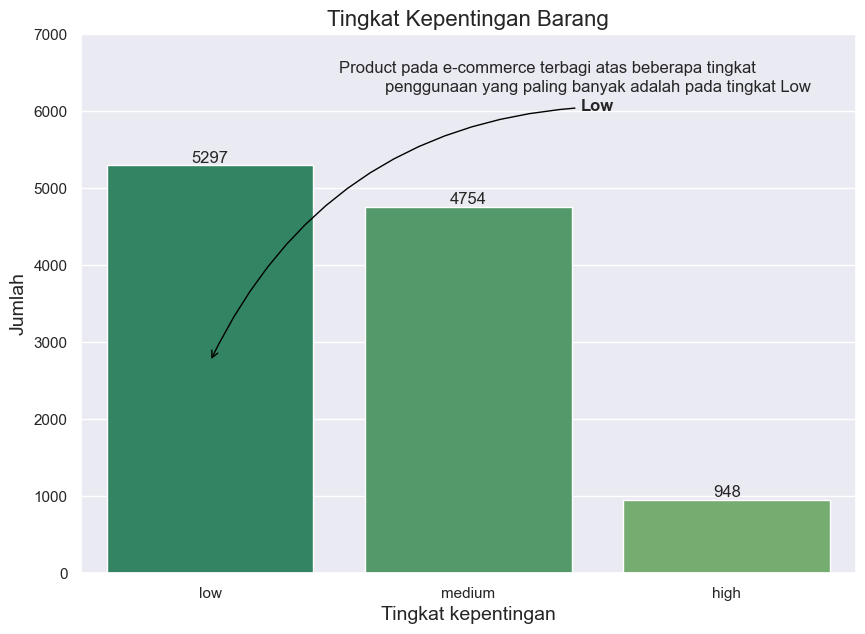

In [11]:
plt.figure(figsize = (10,7))
df_grouped = df.groupby('Product_importance')['ID'].nunique().reset_index(name='ID').sort_values(by='ID', ascending=False)
ax = sns.barplot(data=df_grouped, x='Product_importance',y='ID')
plt.title('Tingkat Kepentingan Barang', fontsize=16)
plt.xlabel('Tingkat kepentingan', fontsize=14)
plt.ylabel('Jumlah', fontsize=14)
plt.ylim(0,7000)
plt.annotate('Product pada e-commerce terbagi atas beberapa tingkat ', 
            xy=(0.5, 6500),fontsize=12,ha='left')
plt.annotate('penggunaan yang paling banyak adalah pada tingkat Low', xy=(1.5, 6250),ha='center',fontsize=12)
plt.annotate('Low',xy=(0, 2750), xytext=(1.5, 6000), arrowprops=dict(color="black",facecolor='steelblue',arrowstyle="->",connectionstyle="arc3,rad=0.3"),fontsize=12,ha='center',fontweight='bold')
for i in ax.containers:
    ax.bar_label(i,)

plt.show()

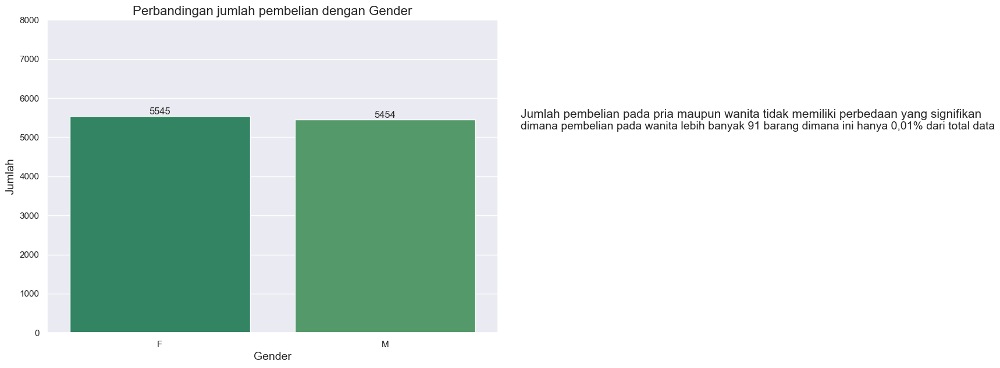

In [12]:
plt.figure(figsize = (10,7))
df_grouped = df.groupby('Gender')['ID'].nunique().reset_index(name='ID').sort_values(by='ID', ascending=False)
ax = sns.barplot(data=df_grouped, x='Gender',y='ID')
plt.title('Perbandingan jumlah pembelian dengan Gender', fontsize=16)
plt.xlabel('Gender', fontsize=14)
plt.ylabel('Jumlah', fontsize=14)
plt.ylim(0,8000)
plt.text(s='Jumlah pembelian pada pria maupun wanita tidak memiliki perbedaan yang signifikan ', 
            x=1.6,y=5500,fontsize=15,ha='left')
plt.text(s='dimana pembelian pada wanita lebih banyak 91 barang dimana ini hanya 0,01% dari total data',
          x=1.6,y=5200,fontsize=14,ha='left')
         

for i in ax.containers:
    ax.bar_label(i,)

plt.show()

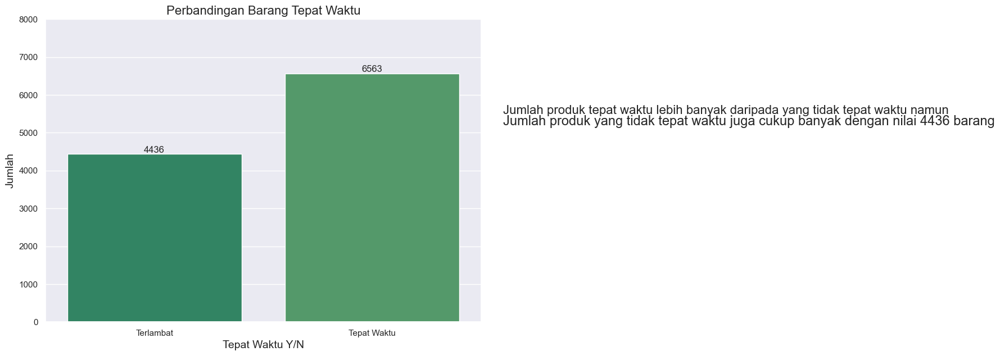

In [13]:
plt.figure(figsize = (10,7))
df_grouped = df.groupby('Reached.on.Time_Y.N')['ID'].nunique().reset_index(name='ID').sort_values(by='ID', ascending=False)
ax = sns.barplot(data=df_grouped, x='Reached.on.Time_Y.N',y='ID')
plt.title('Perbandingan Barang Tepat Waktu', fontsize=16)
x = [0,1]
labels = ['Terlambat','Tepat Waktu']
plt.xticks(x, labels)
plt.xlabel('Tepat Waktu Y/N', fontsize=14)
plt.ylabel('Jumlah', fontsize=14)
plt.ylim(0,8000)
plt.text(s='Jumlah produk tepat waktu lebih banyak daripada yang tidak tepat waktu namun', 
            x=1.6,y=5500,fontsize=16,ha='left')
plt.text(s='Jumlah produk yang tidak tepat waktu juga cukup banyak dengan nilai 4436 barang',
          x=1.6,y=5200,fontsize=17,ha='left')
         
for i in ax.containers:
    ax.bar_label(i,)

plt.show()

### Univariate Analysis Kolom Numerical

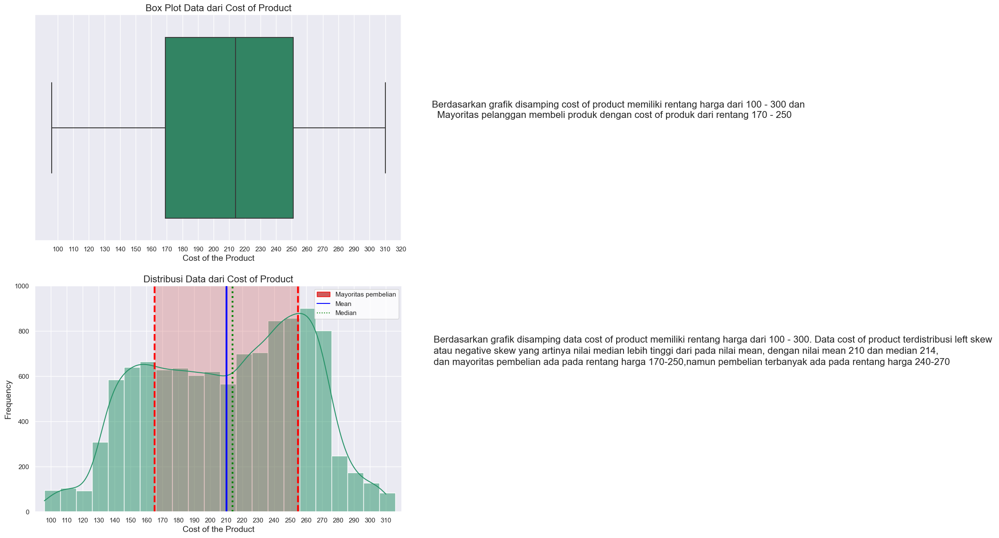

In [14]:
fig, ax = plt.subplots(2, 1, figsize=(11,15))
sns.boxplot(ax=ax[0],data=df, x='Cost_of_the_Product')
ax[0].set_title('Box Plot Data dari Cost of Product',fontsize=16)
ax[0].set_xlabel('Cost of the Product',fontsize=14)
ax[0].text(x=340,y=0, s='Berdasarkan grafik disamping cost of product memiliki rentang harga dari 100 - 300 dan \n  Mayoritas pelanggan membeli produk dengan cost of produk dari rentang 170 - 250\n',
           fontsize=16)
ticks = np.arange(100, 330,10)
ax[0].set_xticks(ticks)
ax[0].set_xticklabels([round(x) for x in ticks])


sns.histplot(ax=ax[1],data=df,x="Cost_of_the_Product",kde=True,binwidth=10)
ax[1].set_title('Distribusi Data dari Cost of Product',fontsize=16)
ax[1].set_ylabel('Frequency',fontsize=14)
ax[1].set_xlabel('Cost of the Product',fontsize=14)
ax[1].set_xlim(90,320)
ticks = np.arange(100, 320,10)
ax[1].set_xticks(ticks)
ax[1].set_ylim(0,1000)
ax[1].stackplot(np.arange(165, 257), [[1000]], colors=('indianred',), alpha=0.3)
ax[1].axvline(x=165, color='red', linestyle='--', linewidth=3)
ax[1].axvline(x=255, color='red', linestyle='--', linewidth=3)
ax[1].axvline(x=np.mean(df['Cost_of_the_Product']), color='blue', linestyle='solid', linewidth=3)
ax[1].axvline(x=np.median(df['Cost_of_the_Product']), color='green', linestyle='dotted', linewidth=3)
ax[1].text(x=340,y=750, s='Berdasarkan grafik disamping data cost of product memiliki rentang harga dari 100 - 300. Data cost of product terdistribusi left skew ' ,fontsize=16)
ax[1].text(x=340,y= 700,s='atau negative skew yang artinya nilai median lebih tinggi dari pada nilai mean, dengan nilai mean 210 dan median 214, ' ,fontsize=16)
ax[1].text(x=340,y=650, s='dan mayoritas pembelian ada pada rentang harga 170-250,namun pembelian terbanyak ada pada rentang harga 240-270  ',fontsize=16)




legend_elements = [Patch(facecolor='indianred', edgecolor='r',
                         label='Mayoritas pembelian'),
                   Line2D([0], [0], ls='solid', color='blue', label='Mean',
                          markerfacecolor='g', markersize=15),
                   Line2D([0], [1], ls='dotted', color='green', label='Median',
                          markerfacecolor='g', markersize=15),]
ax[1].legend(handles=legend_elements, loc='upper right',frameon=True, facecolor='White')

plt.show()

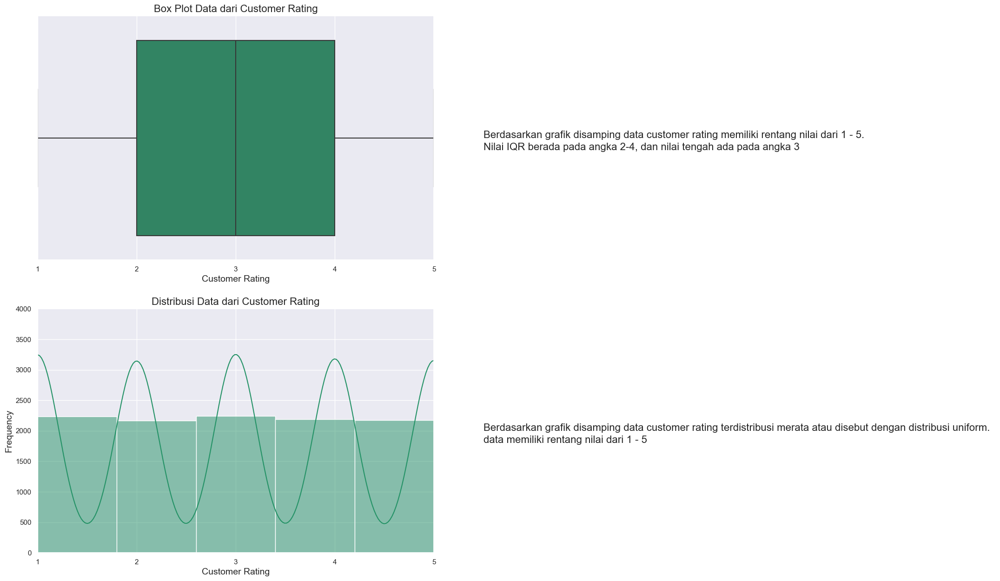

In [15]:

fig, ax = plt.subplots(2, 1, figsize=(11,15))
sns.boxplot(ax=ax[0],data=df, x='Customer_rating')
ax[0].set_title('Box Plot Data dari Customer Rating', fontsize=16)
ax[0].set_xlabel('Customer Rating', fontsize=14)
ax[0].set_xlim(1,5)
ticks = np.arange(1, 6)
ax[0].set_xticks(ticks)
ax[0].text(x=5.5,y=0, s='Berdasarkan grafik disamping data customer rating memiliki rentang nilai dari 1 - 5. ' ,fontsize=16)
ax[0].text(x=5.5,y=0.05, s='Nilai IQR berada pada angka 2-4, dan nilai tengah ada pada angka 3',fontsize=16)




sns.histplot(ax=ax[1],data=df,x="Customer_rating",bins=5,kde=True)
ax[1].set_title('Distribusi Data dari Customer Rating', fontsize=16)
ax[1].set_ylabel('Frequency', fontsize=14)
ax[1].set_ylim(0,4000)
ax[1].set_xlim(1,5)
ax[1].text(x=5.5,y=2000, s='Berdasarkan grafik disamping data customer rating terdistribusi merata atau disebut dengan distribusi uniform.  ' ,fontsize=16)
ax[1].text(x=5.5,y=1800, s='data memiliki rentang nilai dari 1 - 5',fontsize=16)


ticks = np.arange(1, 6)
ax[1].set_xticks(ticks)
ax[1].set_xticklabels([round(x) for x in ticks])
ax[1].set_xlabel('Customer Rating',fontsize=14)


plt.show()

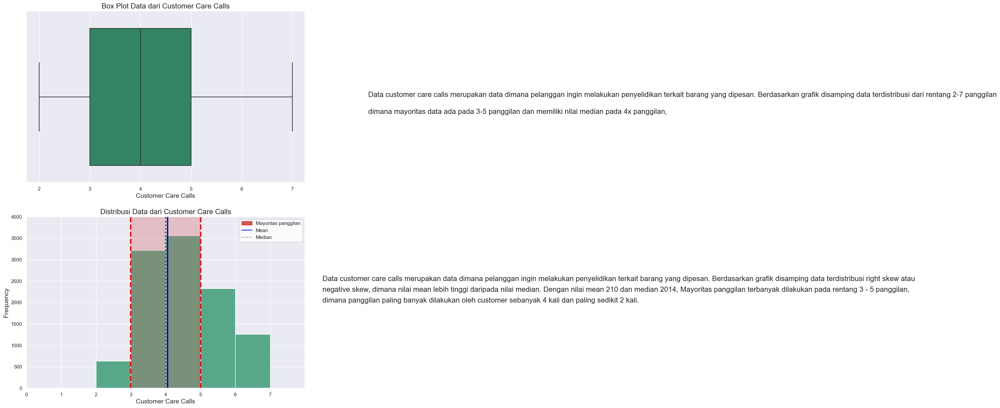

In [16]:

fig, ax = plt.subplots(2, 1, figsize=(11,15))
sns.boxplot(ax=ax[0],data=df, x='Customer_care_calls')
ax[0].set_title('Box Plot Data dari Customer Care Calls', fontsize=16)
ax[0].set_xlabel('Customer Care Calls', fontsize=14)
ax[0].text(x=8.5,y=0, s='Data customer care calls merupakan data dimana pelanggan ingin melakukan penyelidikan terkait barang yang dipesan. Berdasarkan grafik disamping data terdistribusi dari rentang 2-7 panggilan' ,fontsize=16)
ax[0].text(x=8.5,y= 0.1,s='dimana mayoritas data ada pada 3-5 panggilan dan memiliki nilai median pada 4x panggilan, ' ,fontsize=16)



#nums = ['Customer_care_calls', 'Customer_rating', 'Cost_of_the_Product', 'Prior_purchases', 'Discount_offered','Weight_in_gms']

sns.histplot(ax=ax[1],data=df, x='Customer_care_calls',binwidth=1)
ax[1].set_title('Distribusi Data dari Customer Care Calls', fontsize=16)
ax[1].set_ylabel('Frequency', fontsize=14)
ax[1].set_xlabel('Customer Care Calls',fontsize=14)
ax[1].set_ylim(0,4000)
ax[1].set_xlim(1,8) 
ax[1].set_xticks(np.arange(0,8,1))
ax[1].stackplot(np.arange(3, 6,1), [[4000]], colors=('indianred',), alpha=0.3)
ax[1].axvline(x=3, color='red', linestyle='--', linewidth=3)
ax[1].axvline(x=5, color='red', linestyle='--', linewidth=3)
ax[1].axvline(x=np.mean(df['Customer_care_calls']), color='blue', linestyle='solid', linewidth=3)
ax[1].axvline(x=np.median(df['Customer_care_calls']), color='green', linestyle='dotted', linewidth=3)
ax[1].text(x=8.5,y=2500, s='Data customer care calls merupakan data dimana pelanggan ingin melakukan penyelidikan terkait barang yang dipesan. Berdasarkan grafik disamping data terdistribusi right skew atau ' ,fontsize=16)
ax[1].text(x=8.5,y= 2250,s='negative skew, dimana nilai mean lebih tinggi daripada nilai median. Dengan nilai mean 210 dan median 2014, Mayoritas panggilan terbanyak dilakukan pada rentang 3 - 5 panggilan, ' ,fontsize=16)
ax[1].text(x=8.5,y= 2000, s='dimana panggilan paling banyak dilakukan oleh customer sebanyak 4 kali dan paling sedikit 2 kali. ',fontsize=16)

legend_elements = [Patch(facecolor='indianred', edgecolor='r',
                         label='Mayoritas panggilan'),
                   Line2D([0], [0], ls='solid', color='blue', label='Mean',
                          markerfacecolor='g', markersize=15),
                   Line2D([0], [1], ls='dotted', color='green', label='Median',
                          markerfacecolor='g', markersize=15),]
ax[1].legend(handles=legend_elements, loc='upper right',frameon=True, facecolor='White')


plt.show()

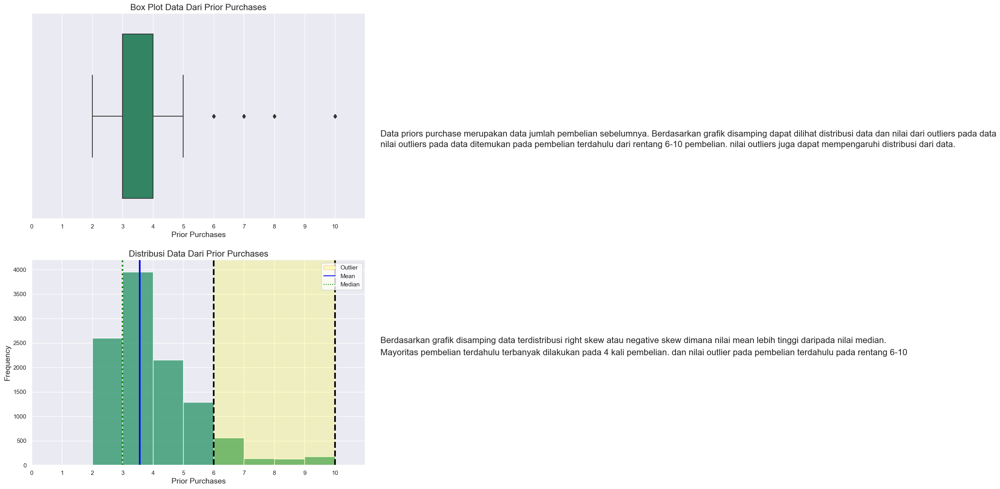

In [17]:
fig, ax = plt.subplots(2, 1, figsize=(11,15))
sns.boxplot(ax=ax[0],data=df, x='Prior_purchases')
ax[0].set_title('Box Plot Data Dari Prior Purchases', fontsize=16)
ax[0].set_xlabel('Prior Purchases', fontsize=14)
ax[0].set_xlim(0,11)
ax[0].set_xticks(np.arange(0,11,1))
ax[0].text(x=11.5,y=0.1, s='Data priors purchase merupakan data jumlah pembelian sebelumnya. Berdasarkan grafik disamping dapat dilihat distribusi data dan nilai dari outliers pada data' ,fontsize=16)
ax[0].text(x=11.5,y= 0.15,s='nilai outliers pada data ditemukan pada pembelian terdahulu dari rentang 6-10 pembelian. nilai outliers juga dapat mempengaruhi distribusi dari data.' ,fontsize=16)



#nums = ['Customer_care_calls', 'Customer_rating', 'Cost_of_the_Product', 'Prior_purchases', 'Discount_offered','Weight_in_gms']

sns.histplot(ax=ax[1],data=df, x='Prior_purchases',binwidth=1)
ax[1].set_title('Distribusi Data Dari Prior Purchases', fontsize=16)
ax[1].set_ylabel('Frequency', fontsize=14)
ax[1].set_xlim(0,11)
ax[1].set_ylim(0,4200)
ticks = np.arange(0, 11,1)
ax[1].set_xticks(ticks)
ax[1].set_xlabel('Prior Purchases',fontsize=14)

ax[1].stackplot(np.arange(6, 11,1), [[4200]], colors=('yellow',), alpha=0.2)
ax[1].axvline(x=6, color='black', linestyle='--', linewidth=3)
ax[1].axvline(x=10, color='black', linestyle='--', linewidth=3)
ax[1].axvline(x=np.mean(df['Prior_purchases']), color='blue', linestyle='solid', linewidth=3)
ax[1].axvline(x=np.median(df['Prior_purchases']), color='green', linestyle='dotted', linewidth=3)
ax[1].text(x=11.5,y=2500, s='Berdasarkan grafik disamping data terdistribusi right skew atau negative skew dimana nilai mean lebih tinggi daripada nilai median.' ,fontsize=16)
ax[1].text(x=11.5,y= 2250,s='Mayoritas pembelian terdahulu terbanyak dilakukan pada 4 kali pembelian. dan nilai outlier pada pembelian terdahulu pada rentang 6-10' ,fontsize=16)


legend_elements = [Patch(facecolor='yellow', edgecolor='r',
                         label='Outlier',alpha=0.2),
                   Line2D([0], [0], ls='solid', color='blue', label='Mean',
                          markerfacecolor='g', markersize=15),
                   Line2D([0], [1], ls='dotted', color='green', label='Median',
                          markerfacecolor='g', markersize=15),]
ax[1].legend(handles=legend_elements, loc='upper right',frameon=True,facecolor='White')


plt.show()

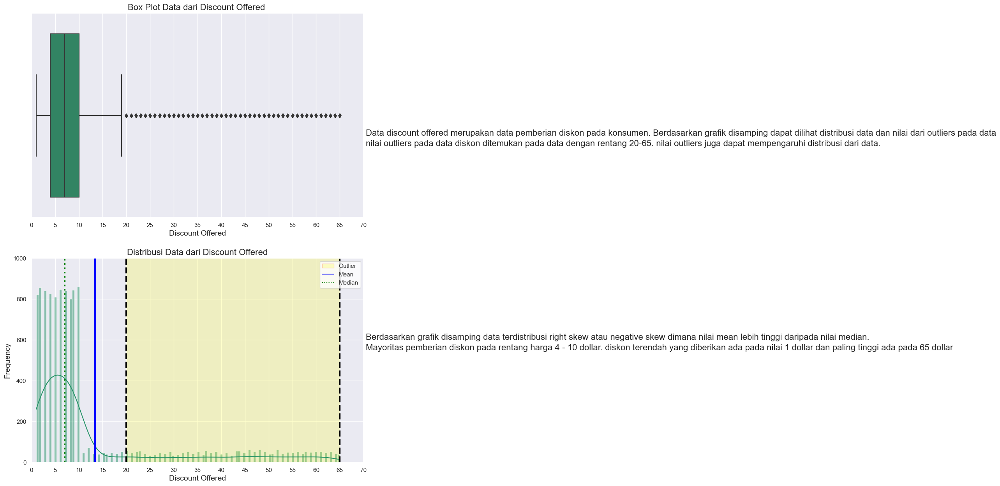

In [18]:
fig, ax = plt.subplots(2, 1, figsize=(11,15))
sns.boxplot(ax=ax[0],data=df, x='Discount_offered')
ax[0].set_title('Box Plot Data dari Discount Offered ', fontsize=16)
ax[0].set_xlabel('Discount Offered', fontsize=14)
ax[0].set_xlim(0,70)
ax[0].set_xticks(np.arange(0,71,5))

ax[0].text(x=70.5,y=0.1, s='Data discount offered merupakan data pemberian diskon pada konsumen. Berdasarkan grafik disamping dapat dilihat distribusi data dan nilai dari outliers pada data' ,fontsize=16)
ax[0].text(x=70.5,y= 0.15,s='nilai outliers pada data diskon ditemukan pada data dengan rentang 20-65. nilai outliers juga dapat mempengaruhi distribusi dari data.' ,fontsize=16)




#nums = ['Customer_care_calls', 'Customer_rating', 'Cost_of_the_Product', 'Prior_purchases', 'Discount_offered','Weight_in_gms']

sns.histplot(ax=ax[1],data=df['Discount_offered'],kde=True)
ax[1].set_title('Distribusi Data dari Discount Offered', fontsize=16)
ax[1].set_ylabel('Frequency', fontsize=14)
ax[1].set_xlabel('Discount Offered',fontsize=14)
ax[1].set_xlim(0,70)
ax[1].set_ylim(0,1000)
ax[1].set_xticks(np.arange(0,71,5))

ax[1].stackplot(np.arange(20, 66,1), [[1000]], colors=('yellow',), alpha=0.2)
ax[1].axvline(x=20, color='black', linestyle='--', linewidth=3)
ax[1].axvline(x=65, color='black', linestyle='--', linewidth=3)
ax[1].text(x=70.5,y=600, s='Berdasarkan grafik disamping data terdistribusi right skew atau negative skew dimana nilai mean lebih tinggi daripada nilai median.' ,fontsize=16)
ax[1].text(x=70.5,y=550,s='Mayoritas pemberian diskon pada rentang harga 4 - 10 dollar. diskon terendah yang diberikan ada pada nilai 1 dollar dan paling tinggi ada pada 65 dollar ' ,fontsize=16)
ax[1].axvline(x=np.mean(df['Discount_offered']), color='blue', linestyle='solid', linewidth=3)
ax[1].axvline(x=np.median(df['Discount_offered']), color='green', linestyle='dotted', linewidth=3)

legend_elements = [Patch(facecolor='yellow', edgecolor='r',
                         label='Outlier',alpha=0.2),
                   Line2D([0], [0], ls='solid', color='blue', label='Mean',
                          markerfacecolor='g', markersize=15),
                   Line2D([0], [1], ls='dotted', color='green', label='Median',
                          markerfacecolor='g', markersize=15),]
ax[1].legend(handles=legend_elements, loc='upper right',frameon=True,facecolor='White')


plt.show()

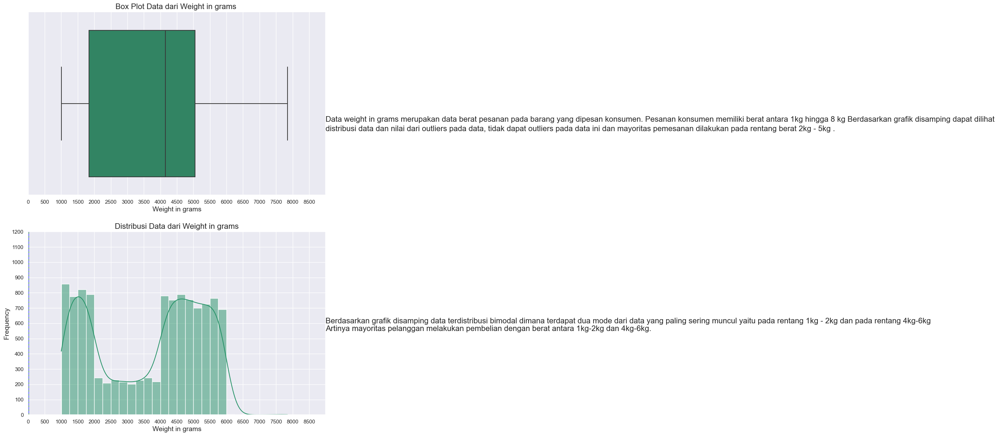

In [19]:
fig, ax = plt.subplots(2, 1, figsize=(11,15))
sns.boxplot(ax=ax[0],data=df, x='Weight_in_gms')
ax[0].set_title('Box Plot Data dari Weight in grams ', fontsize=16)
ax[0].set_xlabel('Weight in grams', fontsize=14)
ax[0].text(x=9000.5,y=0.1, s='Data weight in grams merupakan data berat pesanan pada barang yang dipesan konsumen. Pesanan konsumen memiliki berat antara 1kg hingga 8 kg Berdasarkan grafik disamping dapat dilihat ' ,fontsize=16)
ax[0].text(x=9000.5,y= 0.15,s='distribusi data dan nilai dari outliers pada data, tidak dapat outliers pada data ini dan mayoritas pemesanan dilakukan pada rentang berat 2kg - 5kg .' ,fontsize=16)
ax[0].set_xlim(0,9000)
ax[0].set_xticks(np.arange(0,9000,500))



#nums = ['Customer_care_calls', 'Customer_rating', 'Cost_of_the_Product', 'Prior_purchases', 'Discount_offered','Weight_in_gms']

sns.histplot(ax=ax[1],data=df['Weight_in_gms'],binwidth=250,kde=True)
ax[1].set_title('Distribusi Data dari Weight in grams', fontsize=16)
ax[1].set_ylabel('Frequency', fontsize=14)
ax[1].set_xlabel('Weight in grams',fontsize=14)
ax[1].set_xlim(0,9000)
ax[1].set_xticks(np.arange(0,9000,500))
ax[1].set_ylim(0,1200)
ax[1].set_yticks(np.arange(0,1300,100))


#ax[1].stackplot(np.arange(20, 66,1), [[1000]], colors=('yellow',), alpha=0.2)
#ax[1].axvline(x=20, color='black', linestyle='--', linewidth=3)
#ax[1].axvline(x=65, color='black', linestyle='--', linewidth=3)
ax[1].text(x=9000.5,y=600, s='Berdasarkan grafik disamping data terdistribusi bimodal dimana terdapat dua mode dari data yang paling sering muncul yaitu pada rentang 1kg - 2kg dan pada rentang 4kg-6kg' ,fontsize=16)
ax[1].text(x=9000.5,y=550,s='Artinya mayoritas pelanggan melakukan pembelian dengan berat antara 1kg-2kg dan 4kg-6kg.' ,fontsize=16)
ax[1].axvline(x=np.mean(df['Prior_purchases']), color='blue', linestyle='solid', linewidth=3)
ax[1].axvline(x=np.median(df['Prior_purchases']), color='green', linestyle='dotted', linewidth=3)



plt.show()

## 3. Multivariate Analysis

### Plotting Kurva Numerical - Numerical

#### Heatmap

<Axes: >

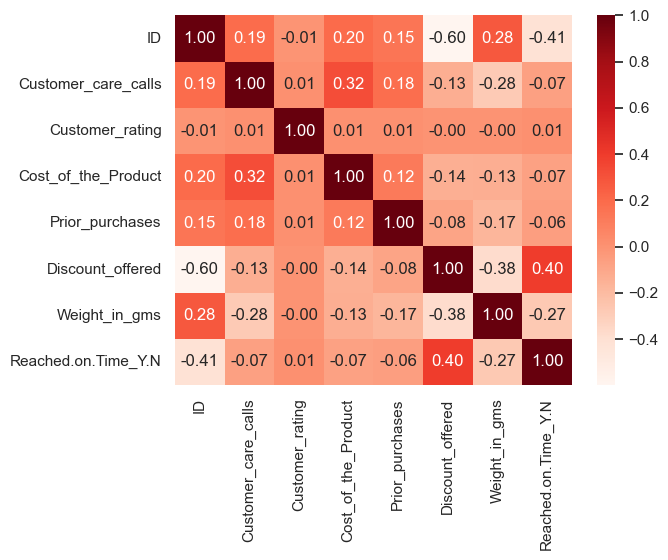

In [20]:
sns.heatmap(df.corr('pearson'), cmap='Reds', annot=True, fmt='.2f')

<b>Berdasarkan Heatmap, customer rating tidak memiliki korelasi dengan kolom apapun (fitur) sehingga tidak dapat digunakan model linear</b>

melainkan pada kolom lain yaitu customer care calls dan reached on time (masih relate dengan problem).

Pada dua fitur ini ditemukan korelasi berturut-turut:

1. Reached on Time dengan hampir seluruh fitur, contohnya (diurutkan dari yang paling kuat) :

>a. Weight in gms (korelasi negatif)

>b. Discount Offered (korelasi positif) 


2. Customer Care Calls dengan hampir seluruh fitur, contohnya (diurutkan dari yang paling kuat):

>a. Cost of Products (korelasi positif) 

>b. Weight in gms (korelasi negatif) 

>c. Prior Purchases (korelasi positif) 

>d. Discount Offered (korelasi negatif) 


Disini terjadi keanehan data yaitu adanya korelasi antara ID dengan kolom lain.

In [21]:
df.corr()

,ID,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N
ID,1.000000,0.188998,-0.005722,0.196791,0.145369,-0.598278,0.278312,-0.411822
Customer_care_calls,0.188998,1.000000,0.012209,0.323182,0.180771,-0.130750,-0.276615,-0.067126
Customer_rating,-0.005722,0.012209,1.000000,0.009270,0.013179,-0.003124,-0.001897,0.013119
Cost_of_the_Product,0.196791,0.323182,0.009270,1.000000,0.123676,-0.138312,-0.132604,-0.073587
Prior_purchases,0.145369,0.180771,0.013179,0.123676,1.000000,-0.082769,-0.168213,-0.055515
Discount_offered,-0.598278,-0.130750,-0.003124,-0.138312,-0.082769,1.000000,-0.376067,0.397108
Weight_in_gms,0.278312,-0.276615,-0.001897,-0.132604,-0.168213,-0.376067,1.000000,-0.268793
Reached.on.Time_Y.N,-0.411822,-0.067126,0.013119,-0.073587,-0.055515,0.397108,-0.268793,1.000000


#### Pair Plot

Gambaran Umum:

- Data yang tersebar merata (tidak terlihat terkumpul) maka dapat dinilai tidak ada korelasi antar dua fitur numerical. 

- Untuk lebih jelasnya menggunakan "hue" untuk Reached On Time pada Pair Plot II

- Korelasi terlihat dari antar numerical berdasarkan Pair Plot ada pada:

>1. Cost of Product dengan Discount Offered

>2. Cost of Product dengan Weight gms

>3. Discount Offered dengan Prior Purchases

>4. Prior Purchases dengan Weight gms

>5. Discount Offered dengan seluruh Categorical

>6. Weight gms dengan seluruh categorical

##### Pair Plot I

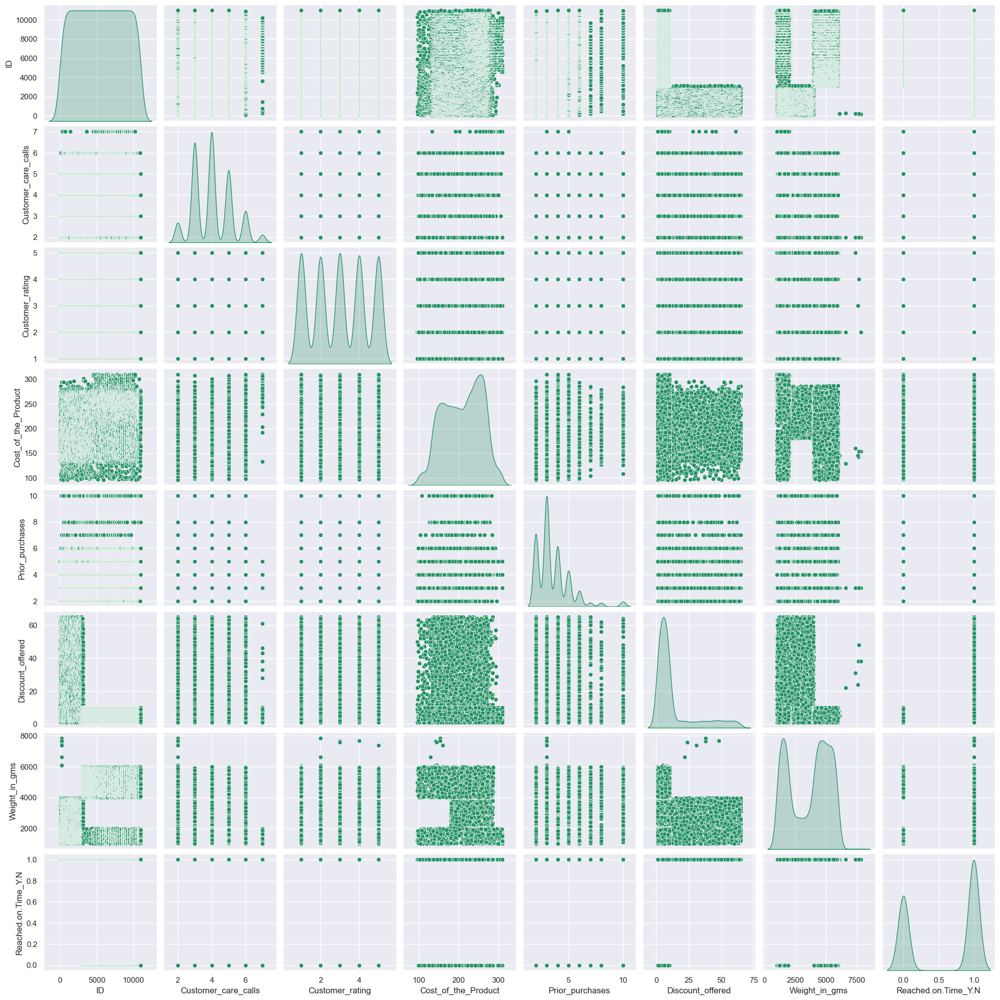

In [22]:
# Pair Plot I:
sns.pairplot(df, diag_kind='kde', palette='summer')

##### Pair Plot II

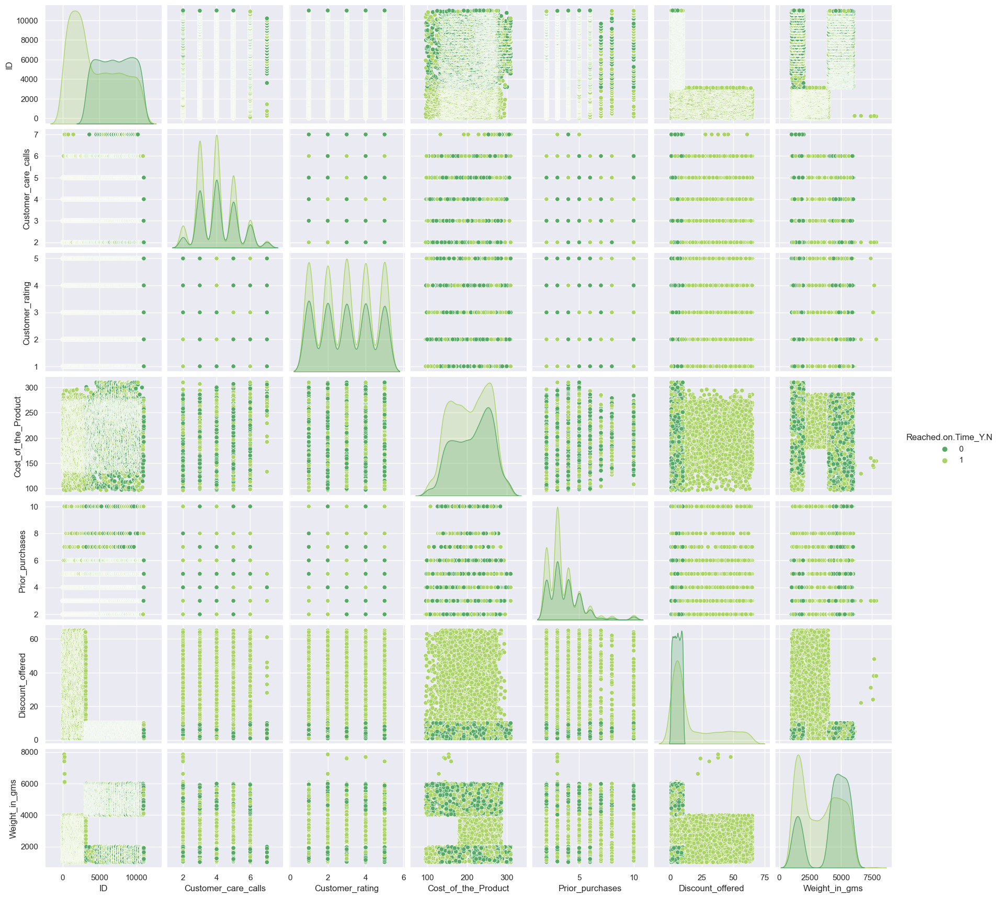

In [23]:
# Pair Plot II:
sns.pairplot(df, diag_kind='kde',
            hue='Reached.on.Time_Y.N',palette='summer')

### Plotting Kurva Categorical dan Numerical


Gambaran Umum:

Korelasi terjadi pada:
- Reached On Time - Discount Offeres

>>Ada perbedaan nilai Discount Offered yang signifikan diantara "0" dan "1" pada kurva Reached on Time dengan Discount Offered 

- Reached On Time - Weight gms

>>Ada perbedaan nilai weight gms diantara "0" dan "1' pada kurva Reached On Time dengan Weight gms.

In [24]:
# Sebelumnya kita ingat

cats = ['Warehouse_block', 'Mode_of_Shipment', 'Product_importance', 'Gender', 'Reached.on.Time_Y.N']
nums = ['Customer_care_calls', 'Customer_rating', 'Cost_of_the_Product', 'Prior_purchases', 'Discount_offered','Weight_in_gms']

##### Warehouse Block - Numerical

Di setiap Block Warehouse memiliki nilai yang sama (pola persebaran datanya sama) pada setiap fitur numericalnya sehingga dapat dianggap tidak ada korelasi diantara keduanya

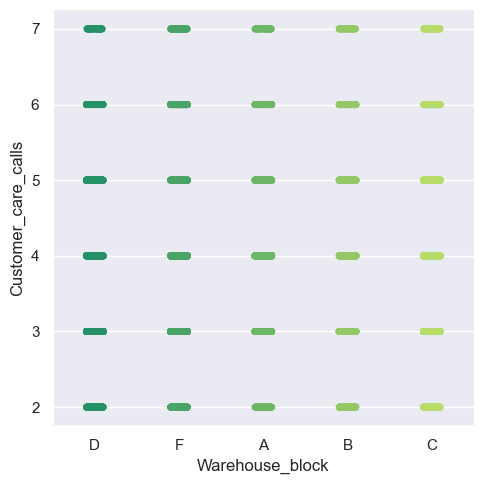

In [25]:
sns.catplot (data=df, x='Warehouse_block',y='Customer_care_calls')

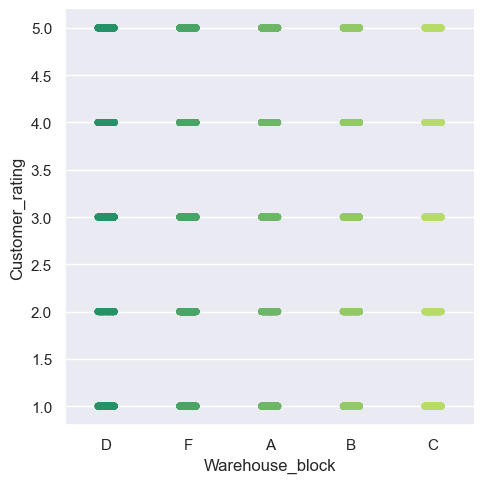

In [26]:
sns.catplot (data=df, x='Warehouse_block',y='Customer_rating')

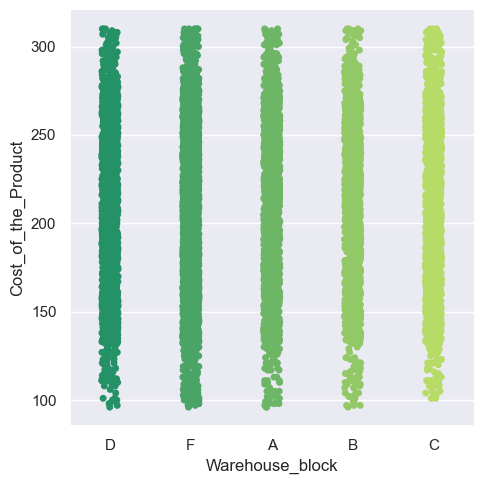

In [27]:
sns.catplot (data=df, x='Warehouse_block',y='Cost_of_the_Product')

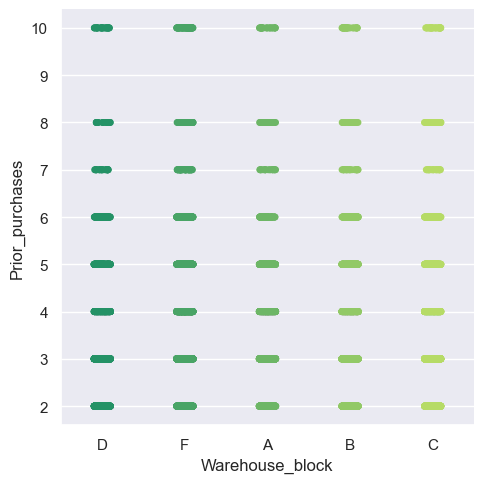

In [28]:
sns.catplot (data=df, x='Warehouse_block',y='Prior_purchases')

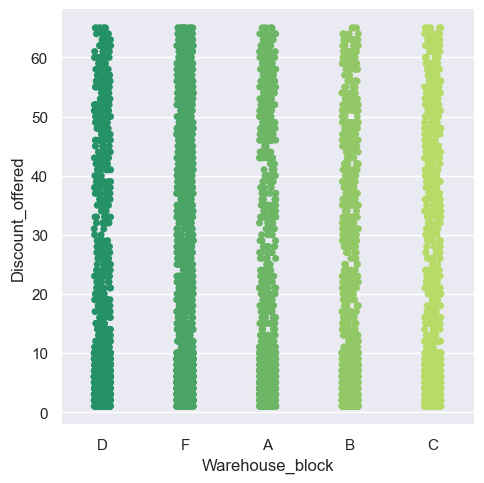

In [29]:
sns.catplot (data=df, x='Warehouse_block',y='Discount_offered')

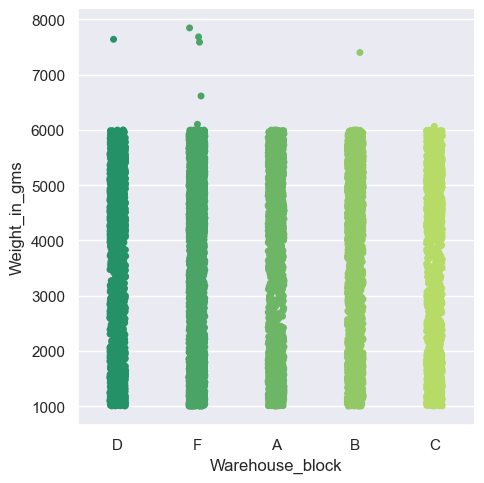

In [30]:
sns.catplot (data=df, x='Warehouse_block',y='Weight_in_gms')

##### Mode of Shipment - Numerical
Di setiap jenis Mode of Shipment memiliki nilai yang sama (pola persebaran datanya sama) pada setiap fitur numericalnya sehingga dapat dianggap tidak ada korelasi diantara keduanya

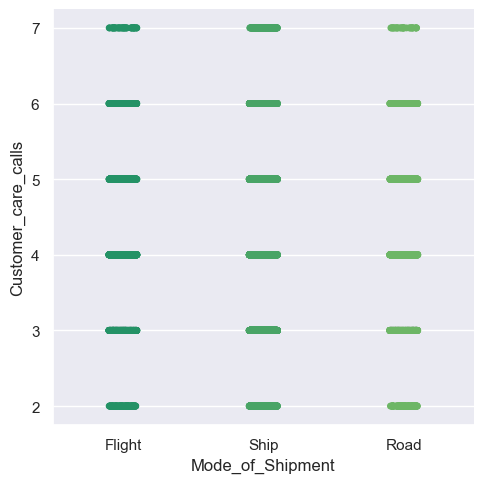

In [31]:
sns.catplot (data=df, x='Mode_of_Shipment',y='Customer_care_calls')

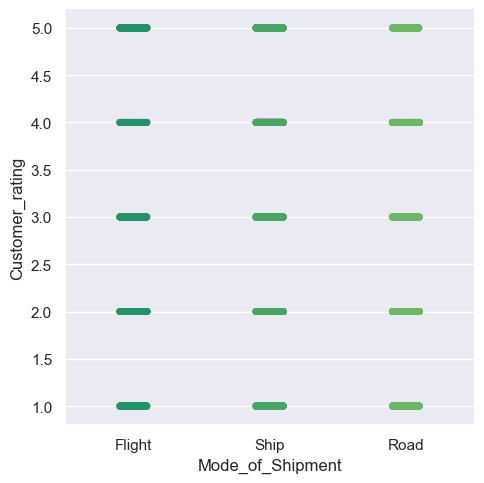

In [32]:
sns.catplot (data=df, x='Mode_of_Shipment',y='Customer_rating')

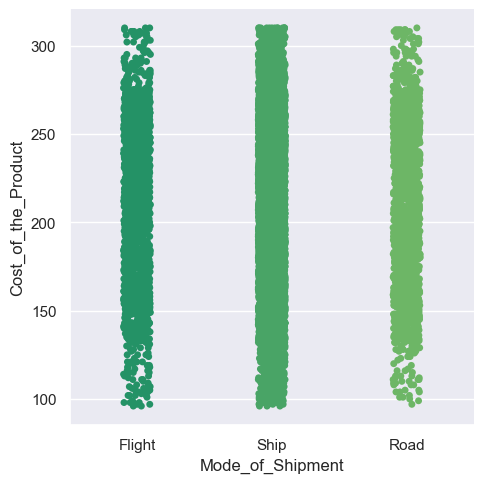

In [33]:
sns.catplot (data=df, x='Mode_of_Shipment',y='Cost_of_the_Product')

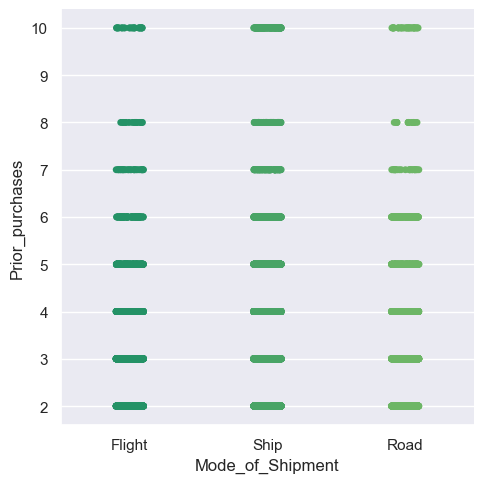

In [34]:
sns.catplot (data=df, x='Mode_of_Shipment',y='Prior_purchases')

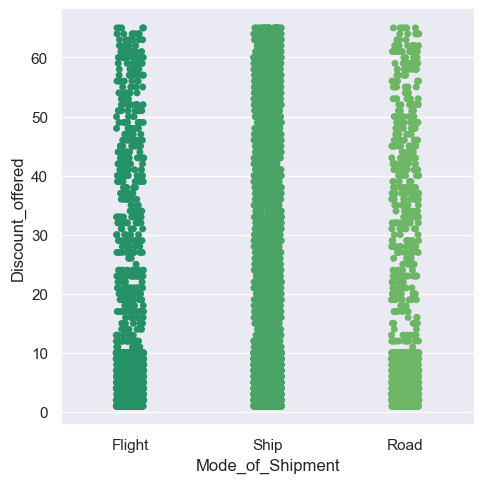

In [35]:
sns.catplot (data=df, x='Mode_of_Shipment',y='Discount_offered')

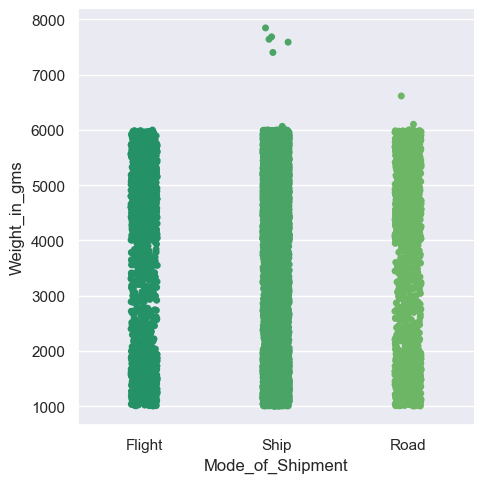

In [36]:
sns.catplot (data=df, x='Mode_of_Shipment',y='Weight_in_gms')

##### Product Importance - Numerical
Di setiap jenis Product (Low, Medium, High) jumlah Customer care calls untuk setiap jenis Product Importance memiliki nilai yang sama sehingga dapat dianggap tidak ada korelasi diantara keduanya

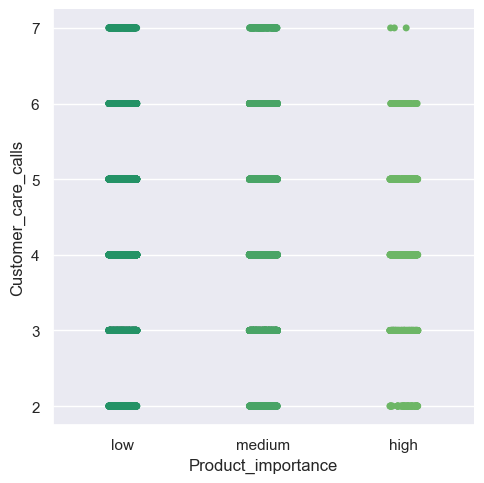

In [37]:
sns.catplot (data=df, x='Product_importance',y='Customer_care_calls')

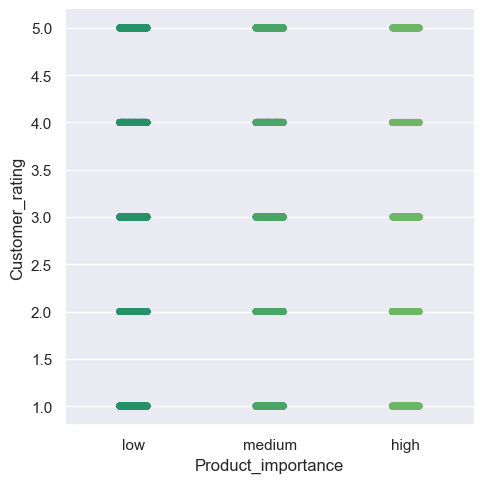

In [38]:
sns.catplot (data=df, x='Product_importance',y='Customer_rating')

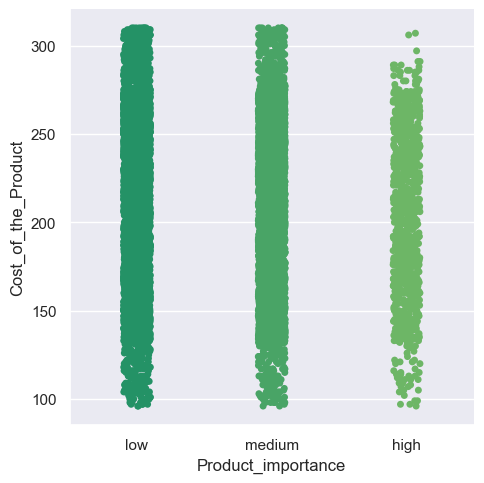

In [39]:
sns.catplot (data=df, x='Product_importance',y='Cost_of_the_Product')

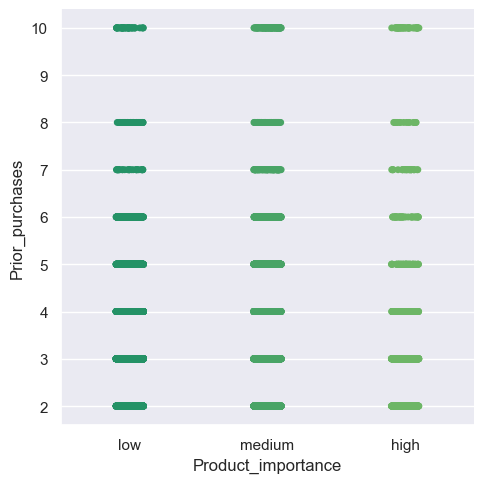

In [40]:
sns.catplot (data=df, x='Product_importance',y='Prior_purchases')

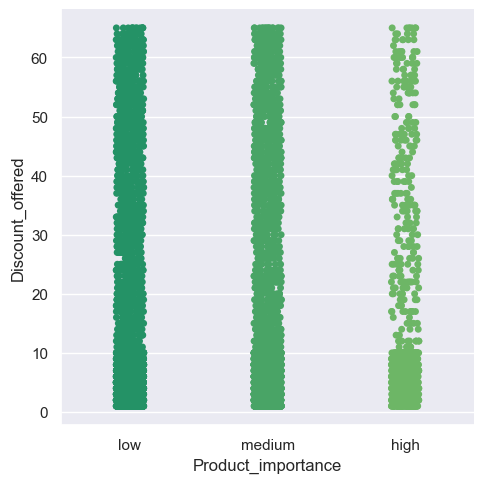

In [41]:
sns.catplot (data=df, x='Product_importance',y='Discount_offered')

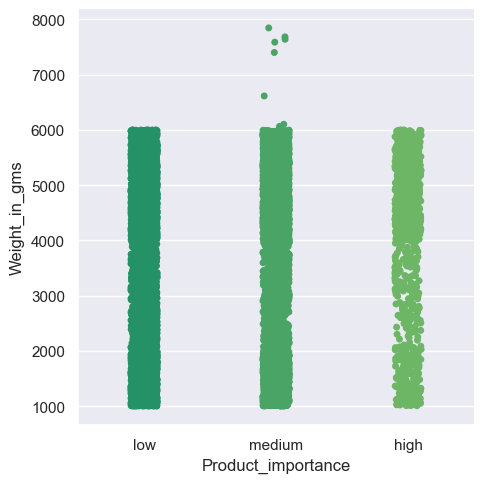

In [42]:
sns.catplot (data=df, x='Product_importance',y='Weight_in_gms')

##### Gender - Numerical
Di setiap Gender (M dan F) memiliki nilai yang sama (pola persebaran datanya sama) pada setiap fitur numericalnya sehingga dapat dianggap tidak ada korelasi diantara keduanya

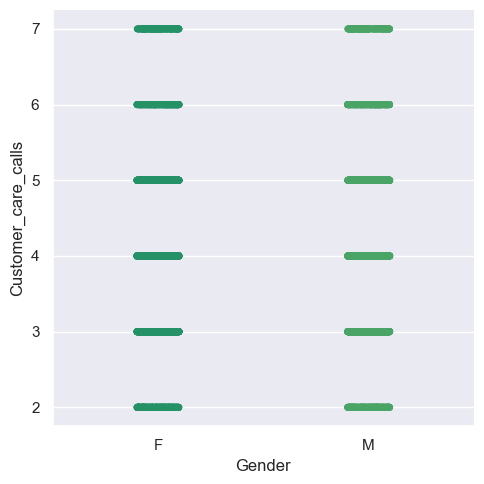

In [43]:
sns.catplot (data=df, x='Gender',y='Customer_care_calls')

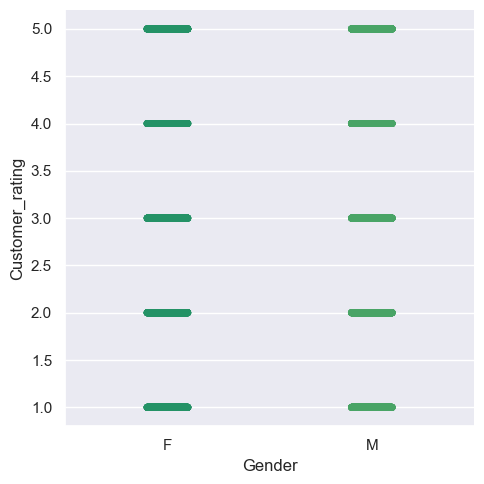

In [44]:
sns.catplot (data=df, x='Gender',y='Customer_rating')

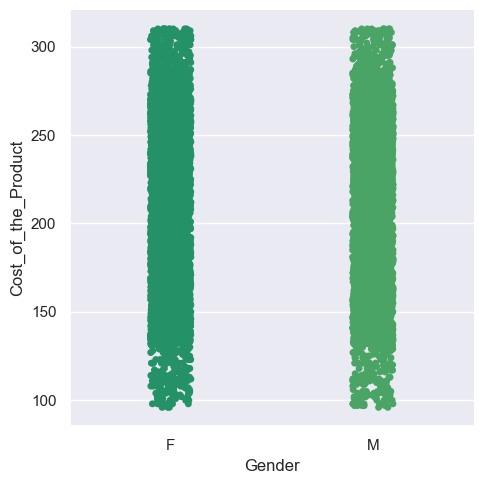

In [45]:
sns.catplot (data=df, x='Gender',y='Cost_of_the_Product')

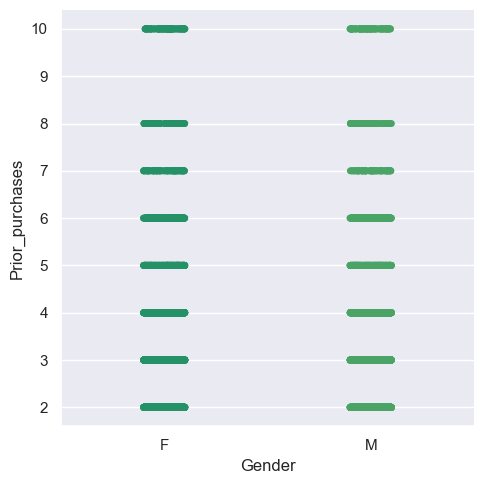

In [46]:
sns.catplot (data=df, x='Gender',y='Prior_purchases')

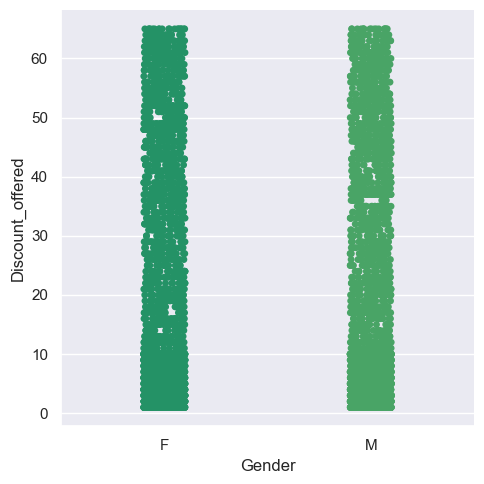

In [47]:
sns.catplot (data=df, x='Gender',y='Discount_offered')

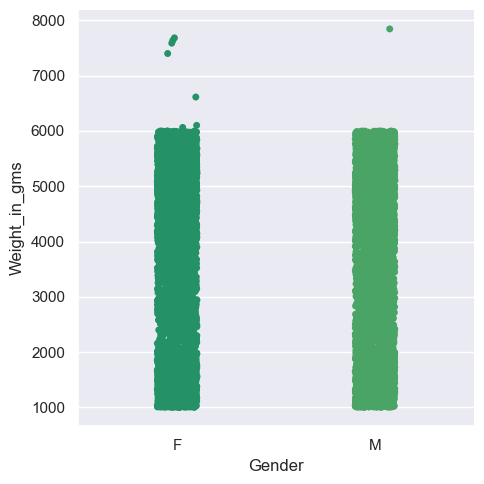

In [48]:
sns.catplot (data=df, x='Gender',y='Weight_in_gms')

##### Reached On Time - Numerical

- Nilai Discount Offer untuk Reached On Time "0" dengan Discount Offer untuk Reached on Time "1" berbeda. 

- Nilai Weight gms untuk Reached On Time  "0" dengan Weight gms untuk Reached On Time "1" berbeda. 

Sehingga dapat disimpulkan ada korelasi diantara:

1. Reached On Time dengan Discount Offer
2. Reached On Time dengan Weight gms

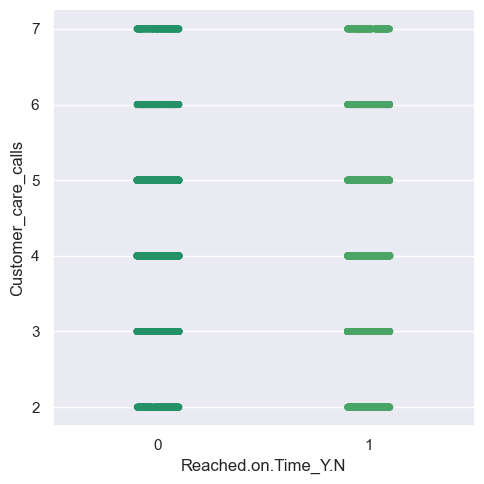

In [49]:
sns.catplot (data=df, x='Reached.on.Time_Y.N',y='Customer_care_calls')

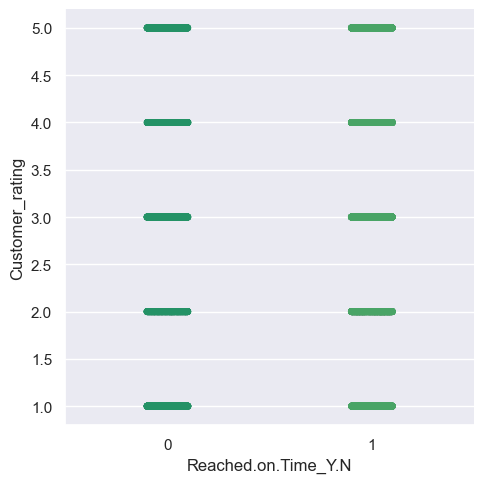

In [50]:
sns.catplot (data=df, x='Reached.on.Time_Y.N',y='Customer_rating')

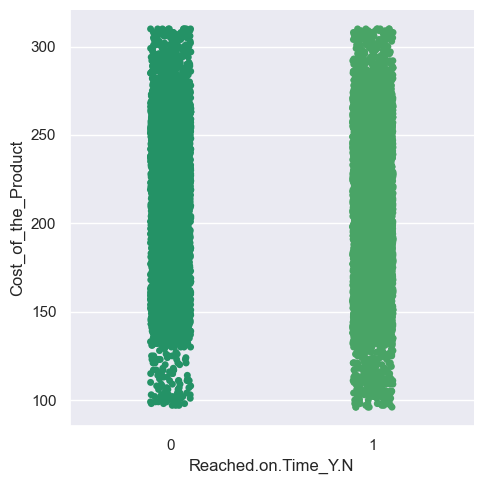

In [51]:
sns.catplot (data=df, x='Reached.on.Time_Y.N',y='Cost_of_the_Product')

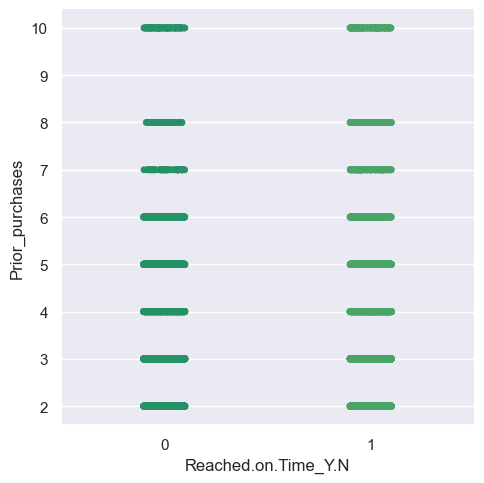

In [52]:
sns.catplot (data=df, x='Reached.on.Time_Y.N',y='Prior_purchases')

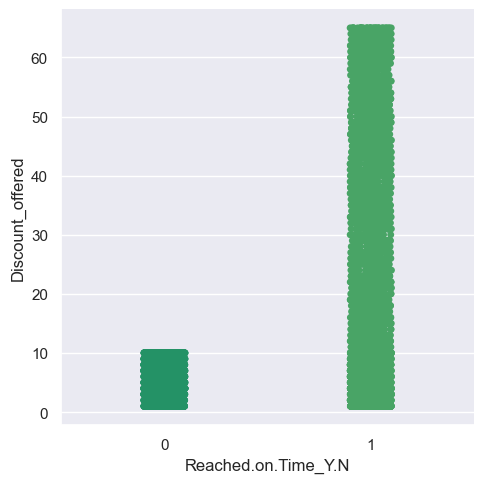

In [53]:
sns.catplot (data=df, x='Reached.on.Time_Y.N',y='Discount_offered')

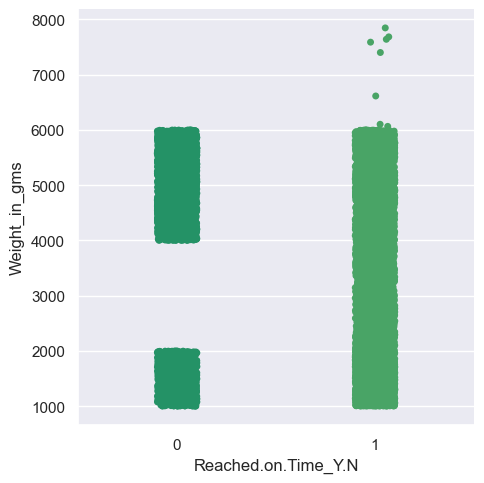

In [54]:
sns.catplot (data=df, x='Reached.on.Time_Y.N',y='Weight_in_gms')

### Plotting Antara 2 Categorical

Setelah melakukan Plotting, diperoleh:

Adanya korelasi antara kedua Categorical yang ditandai adanya perbedaan warna (hijau muda dan hijau tua) :

1. Warehouse Block dengan fitur categorical lainnya yang ditunjukkan dengan tiap Block Warehouse (D, F, A, B, C) yang mana memiliki perbedaan warna. 

2. Begitupula dengan Product Importance, Mode of Shipment, dan Reached On Time saling berkorelasi kecuali Gender

<i>Note: Diberikan grafik tambahan untuk Reached on Time dengan fitur categorical lainnya.<i>

In [55]:
# Sebelumnya kita ingat

cats = ['Warehouse_block', 'Mode_of_Shipment', 'Product_importance', 'Gender', 'Reached.on.Time_Y.N']
nums = ['Customer_care_calls', 'Customer_rating', 'Cost_of_the_Product', 'Prior_purchases', 'Discount_offered','Weight_in_gms']

#### Warehouse dengan Product Importance

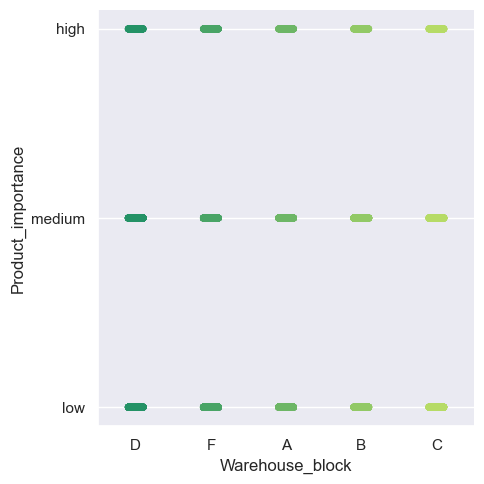

In [56]:
sns.catplot (data=df, x='Warehouse_block',y='Product_importance')

#### Warehouse dengan Gender

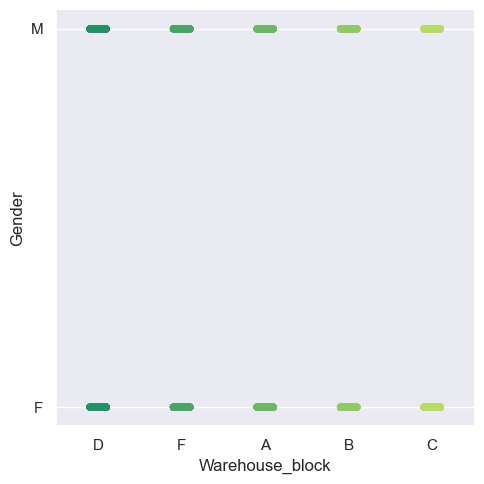

In [57]:
sns.catplot (data=df, x='Warehouse_block',y='Gender')

#### Warehouse dengan Reached On Time

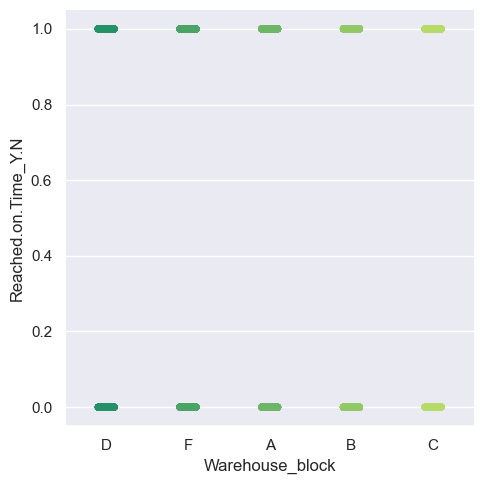

In [58]:
sns.catplot (data=df, x='Warehouse_block',y='Reached.on.Time_Y.N')

<Axes: xlabel='jumlah', ylabel='Warehouse_block'>

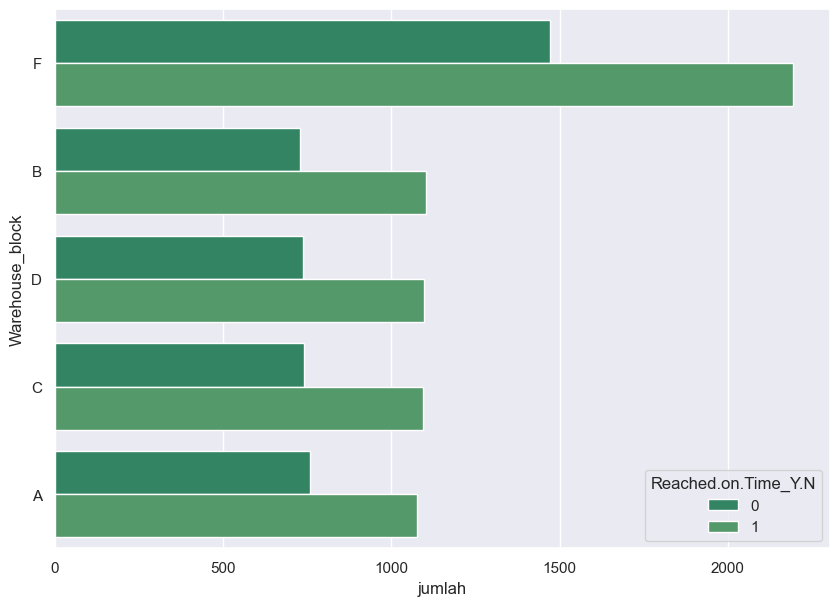

In [59]:
# Lebih detail tentang Kurva Warehouse Block dengan Reached On Time

plt.figure(figsize = (10,7))
df_group= df.groupby(['Warehouse_block','Reached.on.Time_Y.N'])['ID'].nunique().reset_index(name='jumlah').sort_values(by='jumlah', ascending=False) 
sns.barplot(data=df_group, x='jumlah',y='Warehouse_block', hue='Reached.on.Time_Y.N')

#### Mode Of Shipment dengan Product Importance

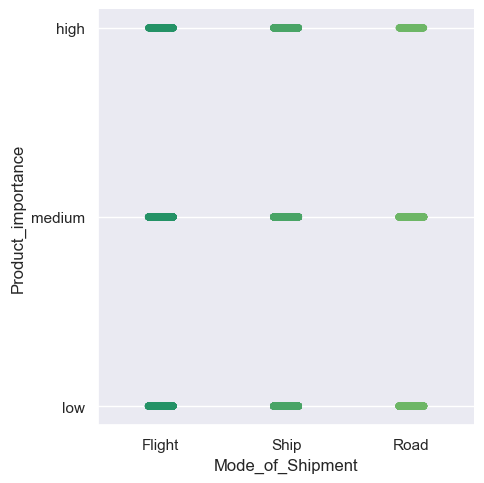

In [60]:
sns.catplot (data=df, x='Mode_of_Shipment',y='Product_importance')

#### Mode Of Shipment dengan Gender

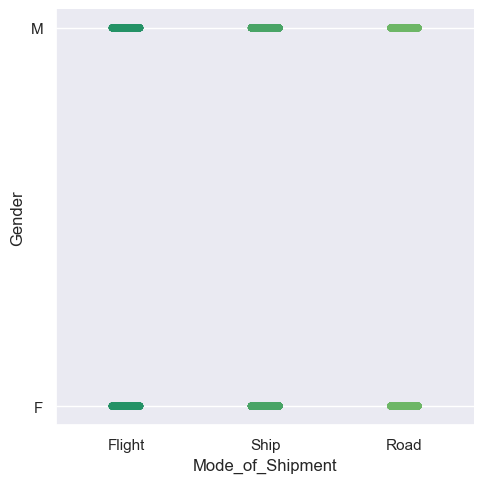

In [61]:
sns.catplot(data=df, x='Mode_of_Shipment',y='Gender')

#### Mode Of Shipment dengan Reached On Time

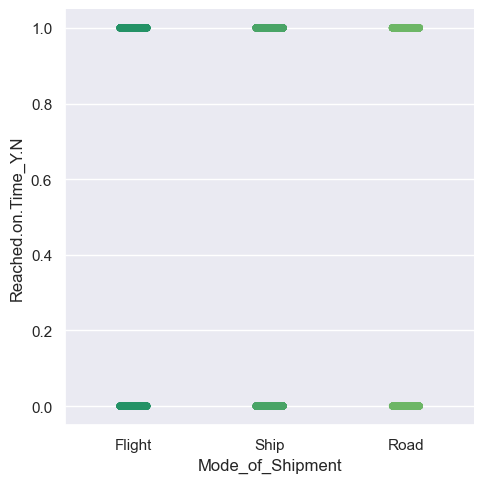

In [62]:
sns.catplot (data=df, x='Mode_of_Shipment',y='Reached.on.Time_Y.N')

<Axes: xlabel='jumlah', ylabel='Mode_of_Shipment'>

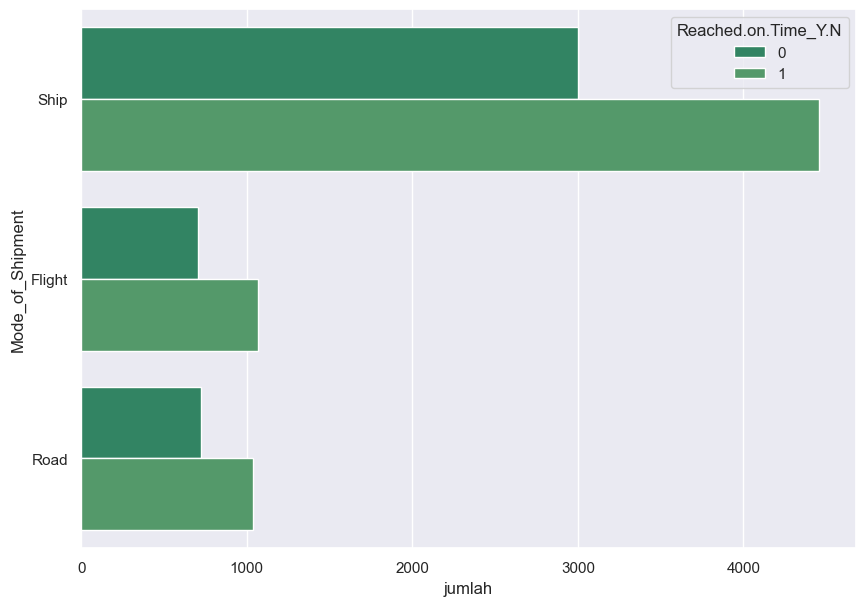

In [63]:
# Kurva detail Mode of Shipment dengan Reached on Time

plt.figure(figsize = (10,7))
df_group2= df.groupby(['Mode_of_Shipment','Reached.on.Time_Y.N'])['ID'].nunique().reset_index(name='jumlah').sort_values(by='jumlah', ascending=False)
sns.barplot(data=df_group2, x='jumlah',y='Mode_of_Shipment', hue='Reached.on.Time_Y.N')

#### Product of Importance dengan Reached On Time

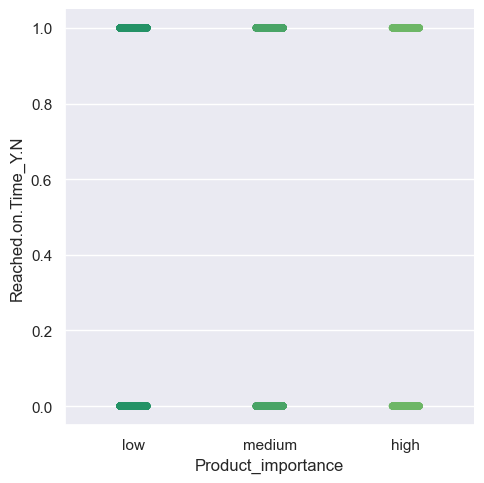

In [64]:
sns.catplot (data=df, x='Product_importance',y='Reached.on.Time_Y.N')

<Axes: xlabel='jumlah', ylabel='Product_importance'>

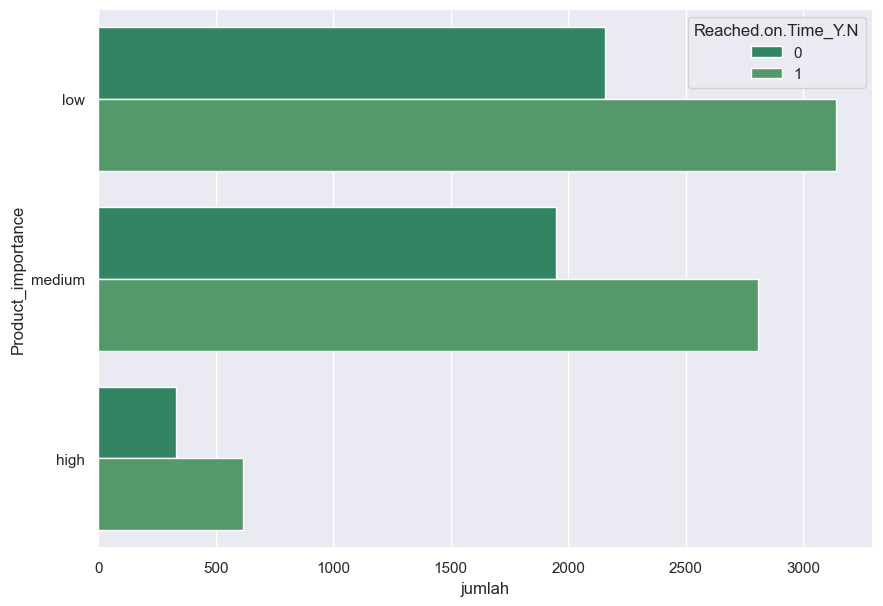

In [65]:
# Kurva detail Product Importance dengan Reached on Time

plt.figure(figsize = (10,7))
df_group3= df.groupby(['Product_importance','Reached.on.Time_Y.N'])['ID'].nunique().reset_index(name='jumlah').sort_values(by='jumlah', ascending=False)
sns.barplot(data=df_group3, x='jumlah',y='Product_importance', hue='Reached.on.Time_Y.N')

#### Product Importance dengan Gender

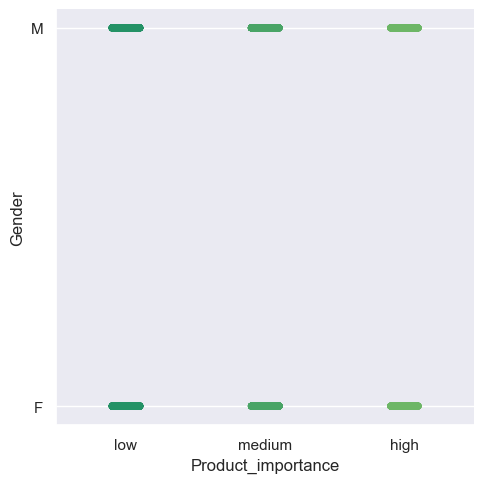

In [66]:
sns.catplot (data=df, x='Product_importance',y='Gender')

#### Gender dan Reached On Time

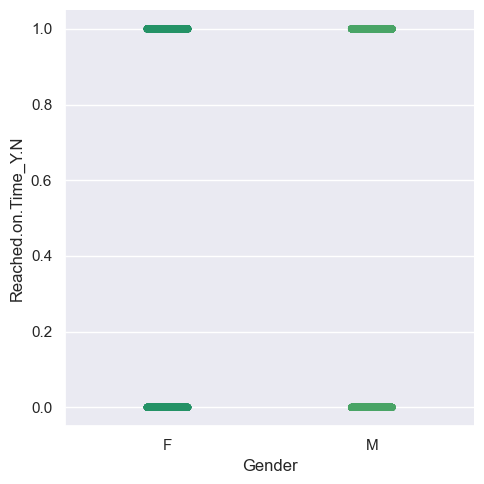

In [67]:
sns.catplot (data=df, x='Gender',y='Reached.on.Time_Y.N')

<Axes: xlabel='jumlah', ylabel='Gender'>

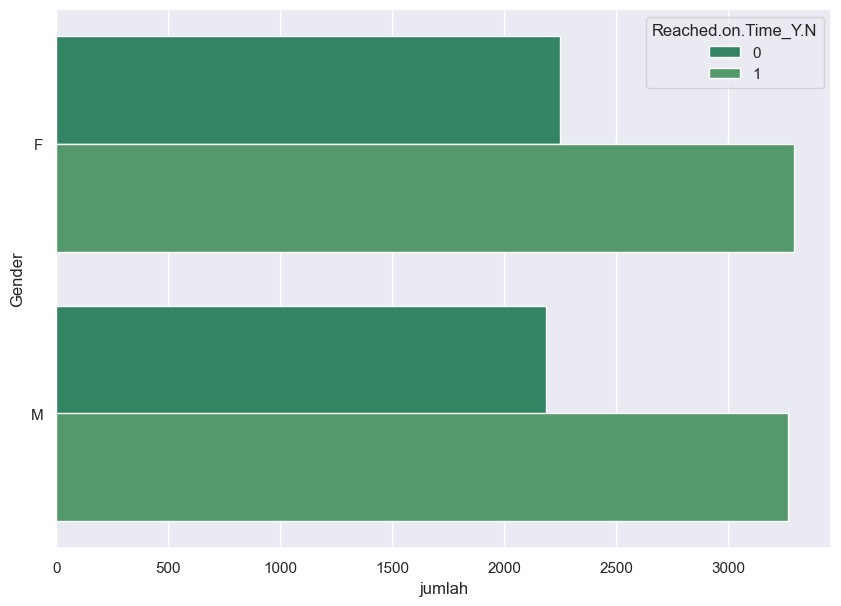

In [68]:
# Kurva detail Gender dengan Reached on Time

plt.figure(figsize = (10,7))
df_group4= df.groupby(['Gender','Reached.on.Time_Y.N'])['ID'].nunique().reset_index(name='jumlah').sort_values(by='jumlah', ascending=False)
sns.barplot(data=df_group4, x='jumlah',y='Gender', hue='Reached.on.Time_Y.N')

## 4. Business Insight

Analisis dan visualisasi untuk menemukan insight dan rekomendasinya. Berdasarkan analisis multivariate terdapat korelasi reach on time atau customer care call berkolerasi dengan fitur lainnya, maka kita akan membahas Insight dari reach on time dan customer care call.

### Insight Reach On Time


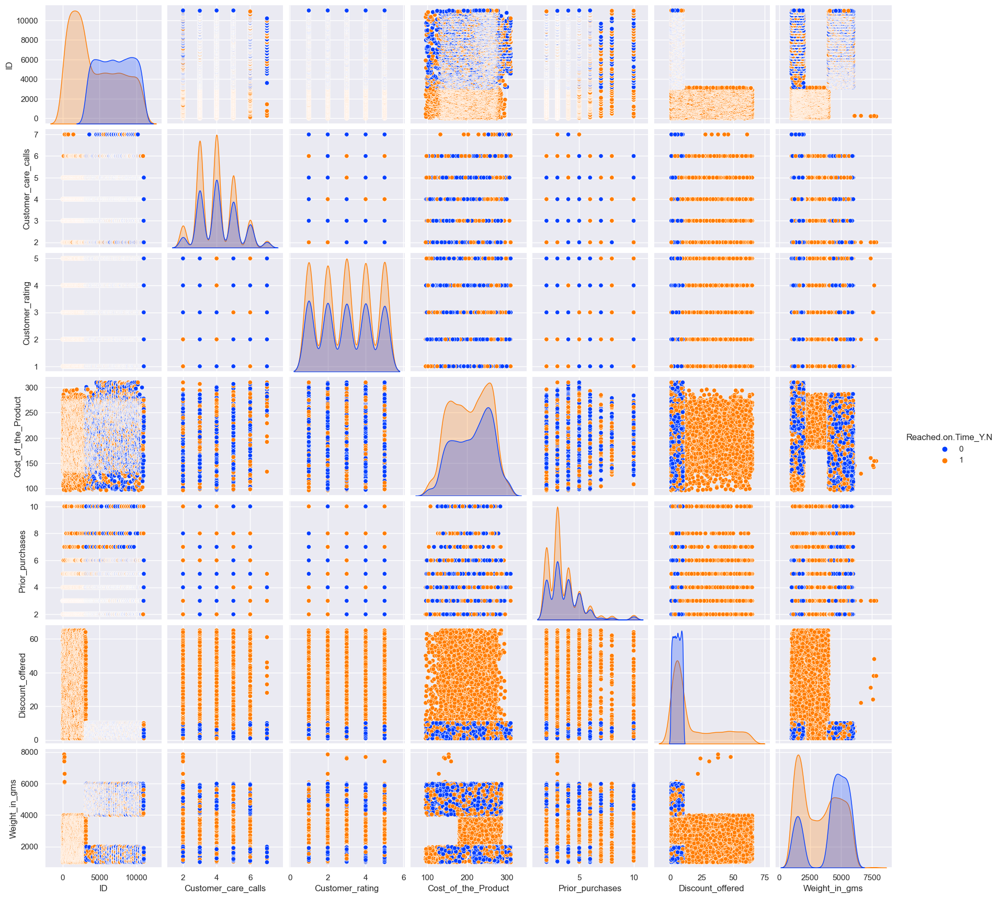

In [69]:
sns.pairplot(df, hue='Reached.on.Time_Y.N', palette='bright')

Berdasarkan grafik diatas terdapat beberapa insight, berikut business insight yang berkolerasi dengan reach on time:
* Disclaimer: label y diisi dengan cost of the product hanya untuk visualisasi yang lebih jelas

#### 1. ID Customer dibawah 3136 tidak ada yang reach on time

<Axes: xlabel='Cost_of_the_Product', ylabel='ID'>

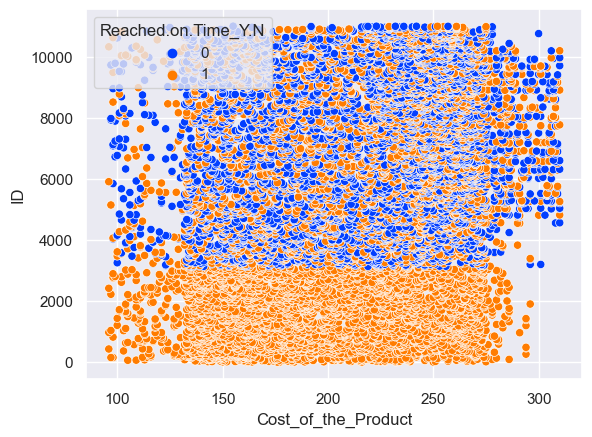

In [70]:
sns.scatterplot(data=df,x='Cost_of_the_Product',y='ID',hue='Reached.on.Time_Y.N', palette='bright')

In [71]:
df_id_noreach = df[df['Reached.on.Time_Y.N']== 1]
df_id_reach = df[df['Reached.on.Time_Y.N']== 0]
df_id_reach['ID'].min()

3136

<b>Rekomendasi:</b>

- Terdapat Error pada ID customer yang dibawah 3136 sehingga perlu ada perbaikan sistem.

<b>Tidak ada perbedaan sebaran data antara ID customer dibawah 3136 dan  diatas 3136.</b>

In [72]:
def id(x):
    try:
        if x['ID'] <= 3136:
          id = 'ID dibawah 3136'
        else:
          id = 'ID diatas 3136'
        return id
    except:
        pass
df_id = df
df_id['Customer'] = df.apply(lambda x: id(x), axis=1)

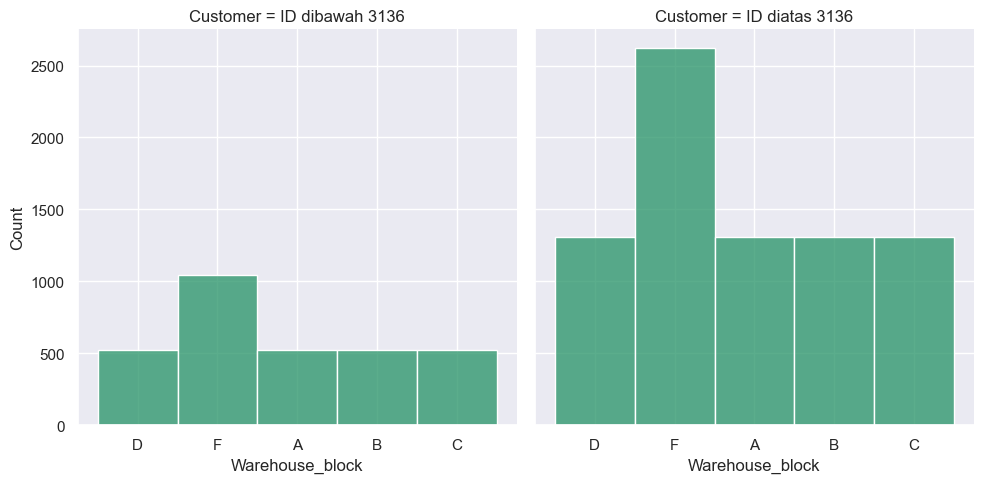

In [73]:
sns.displot(data=df_id, x='Warehouse_block', col='Customer')

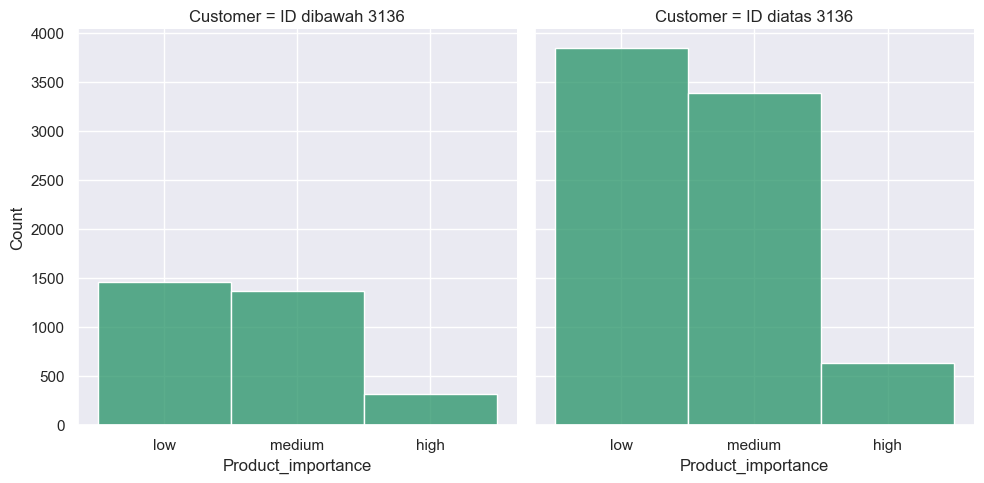

In [74]:
sns.displot(data=df_id, x='Product_importance', col='Customer')

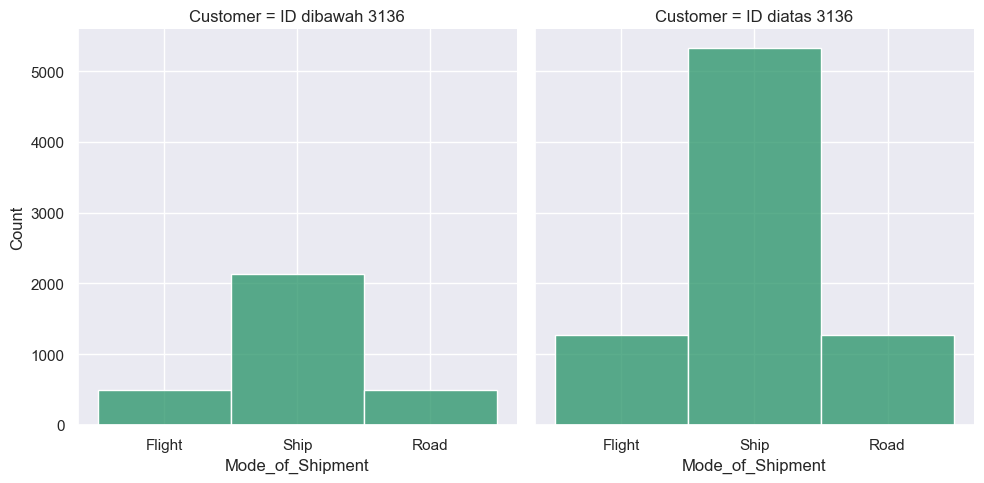

In [75]:
sns.displot(data=df_id, x='Mode_of_Shipment', col='Customer')

#### 2. Diskon diatas 10 persen tidak ada yang reach on time

<Axes: xlabel='Cost_of_the_Product', ylabel='Discount_offered'>

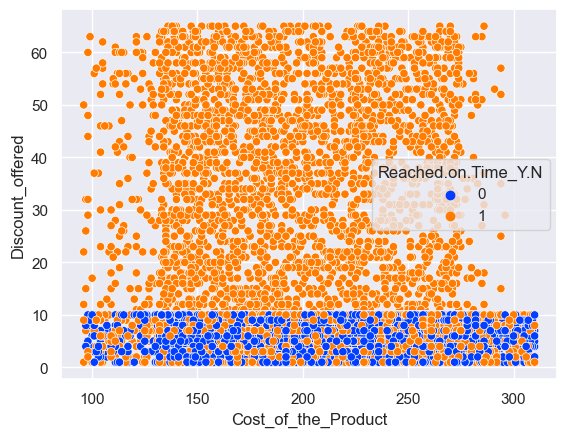

In [76]:
sns.scatterplot(data=df, x='Cost_of_the_Product',y='Discount_offered',hue='Reached.on.Time_Y.N', palette='bright')

In [77]:
df_id_reach['Discount_offered'].max()

10

Rekomendasi:

*   Diskon perlu dibatasi sampai dengan 10 persen agar biaya promosi untuk diskon bisa dialihkan ke biaya pengiriman





**Tidak ada perbedaan sebaran data antara diskon dibawah 10 persen dan  diatas 10 persen**

In [78]:
def diskon(x):
    try:
        if x['Discount_offered'] <= 10:
          diskon = 'Diskon dibawah 10%'
        else:
          diskon = 'Diskon diatas 10%'
        return diskon
    except:
        pass
df_diskon = df
df_diskon['Diskon'] = df.apply(lambda x: diskon(x), axis=1)

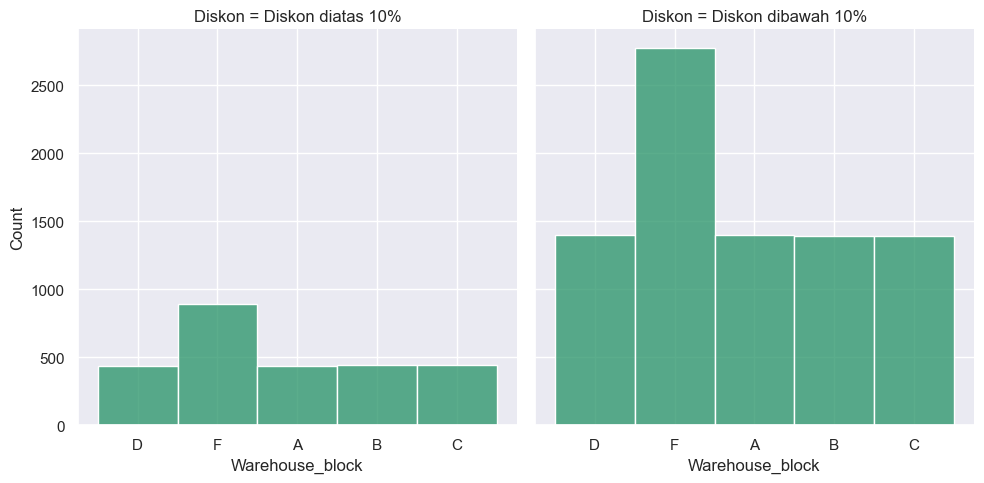

In [79]:
sns.displot(data=df_diskon, x='Warehouse_block', col='Diskon')

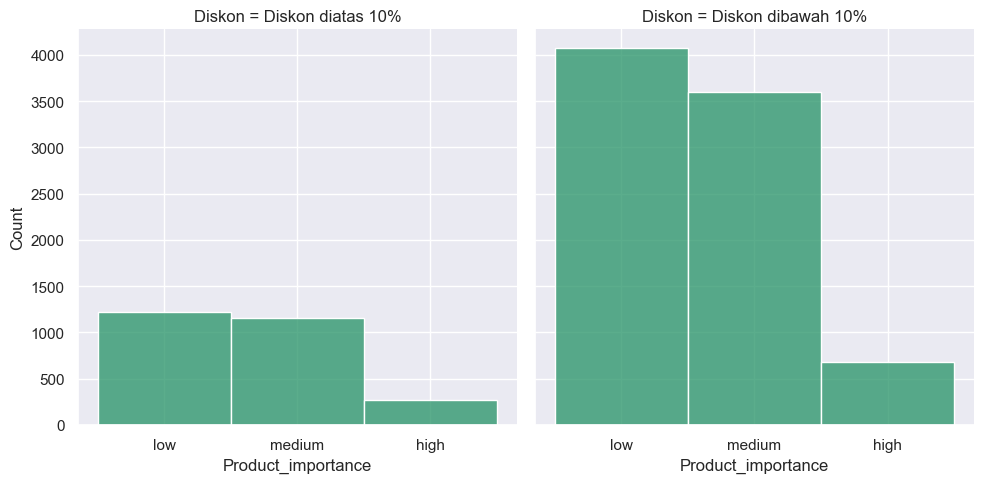

In [80]:
sns.displot(data=df_diskon, x='Product_importance', col='Diskon')

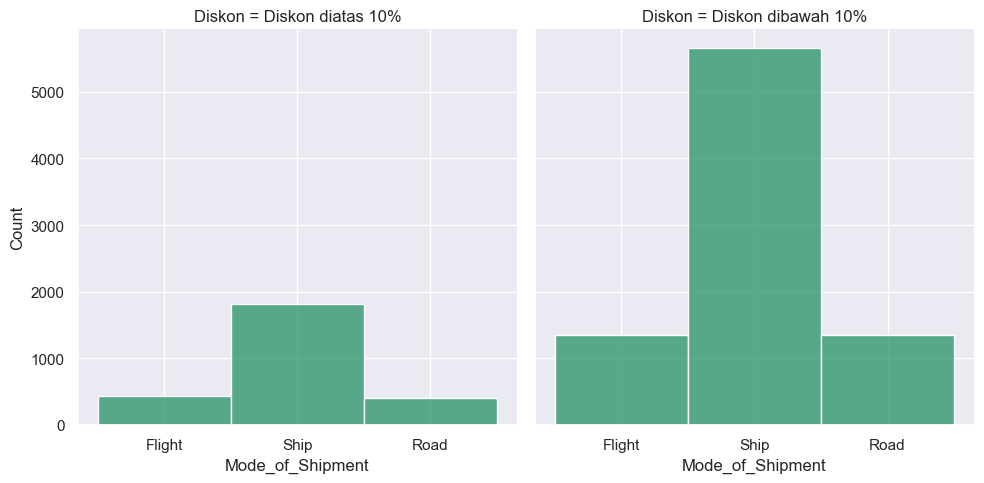

In [81]:
sns.displot(data=df_diskon, x='Mode_of_Shipment', col='Diskon')

#### 3.  Berat barang diatas 2000gr sampai 4000gr tidak ada yang reach on time

<Axes: xlabel='Cost_of_the_Product', ylabel='Weight_in_gms'>

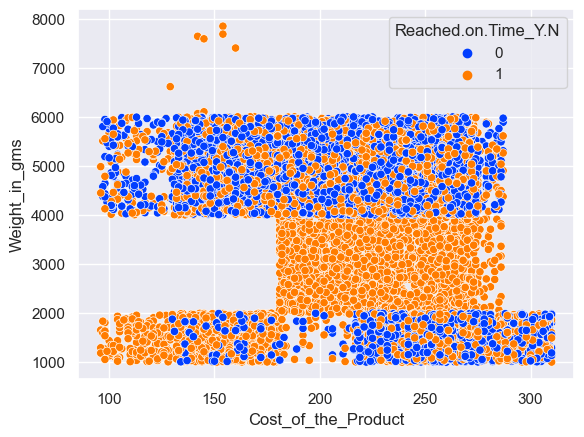

In [82]:
sns.scatterplot(data=df, x='Cost_of_the_Product',y='Weight_in_gms',hue='Reached.on.Time_Y.N', palette='bright')

In [83]:
df_id_reach_a = df_id_reach[df_id_reach['Weight_in_gms'] < 3000]
df_id_reach_b = df_id_reach[df_id_reach['Weight_in_gms'] > 3000]
print(df_id_reach_b['Weight_in_gms'].min())
print(df_id_reach_a['Weight_in_gms'].max())

4000
2000


Rekomendasi:


*   Barang yang beratnya diatas 2000gr sampai 4000gr perlu diklasifikasikan ke barang yang diatas 4000gr atau diberikan tambahan biaya pengiriman kepada konsumen



**Terdapat perbedaan sebaran data antara berat yang 2kg-4kg dan bukan 2kg-4kg**


*   Berat 2kg-4kg lebih dominan memilih product importance berjenis low


In [84]:
def berat(x):
    try:
        if x['Weight_in_gms'] <= 4000:
          berat = 'Berat 2kg-4kg'
        elif x['Weight_in_gms'] < 2000:
          berat = 'Berat Bukan 2kg-4kg'
        else:
          berat = 'Berat Bukan 2kg-4kg'
        return berat
    except:
        pass
df_berat = df
df_berat['Berat'] = df.apply(lambda x: berat(x), axis=1)

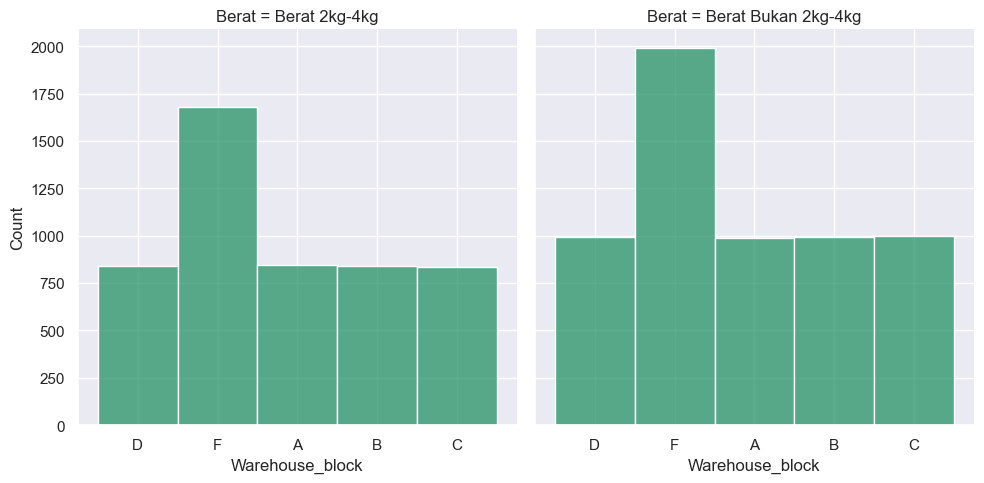

In [85]:
sns.displot(data=df_berat, x='Warehouse_block', col='Berat')

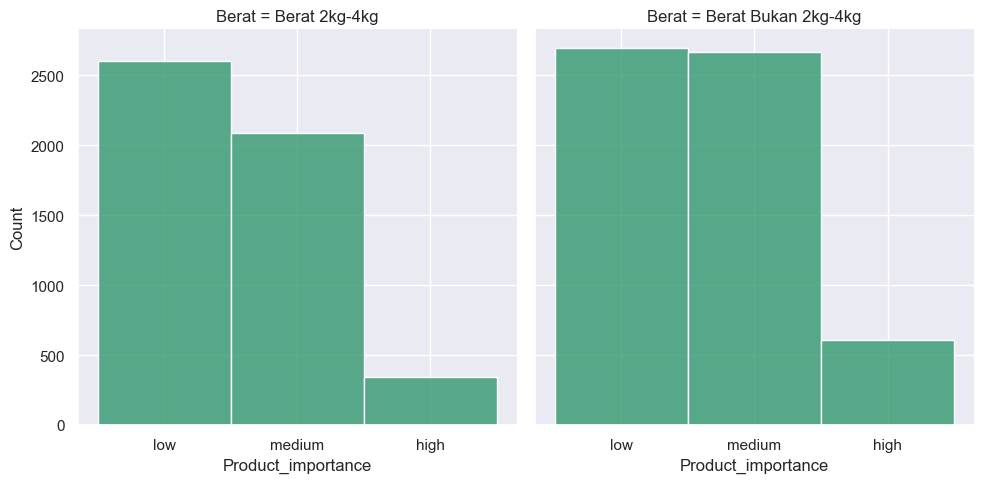

In [86]:
sns.displot(data=df_berat, x='Product_importance', col='Berat')

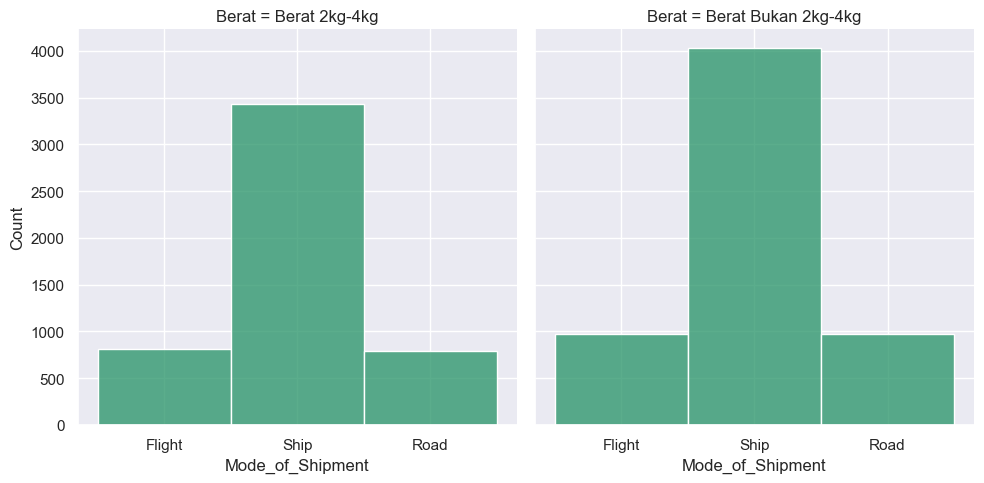

In [87]:
sns.displot(data=df_berat, x='Mode_of_Shipment', col='Berat')

### Insight Customer Care Calls

#### 1.   Semakin tinggi cost of the product maka customer akan semakin sering melakukan call

In [88]:
import plotly.express as px

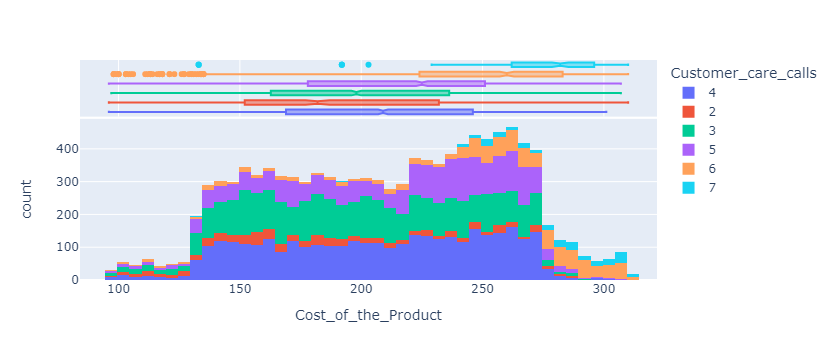

In [89]:
px.histogram(data_frame = df, x = 'Cost_of_the_Product', nbins = 100, color = 'Customer_care_calls',
             marginal = 'box')

Rekomendasi:

*   Customer yang membeli barang dengan cost of product yang tinggi bisa diberikan notifikasi secara berkala


#### 2.  Semakin ringan berat barang maka customer akan semakin sering melakukan call

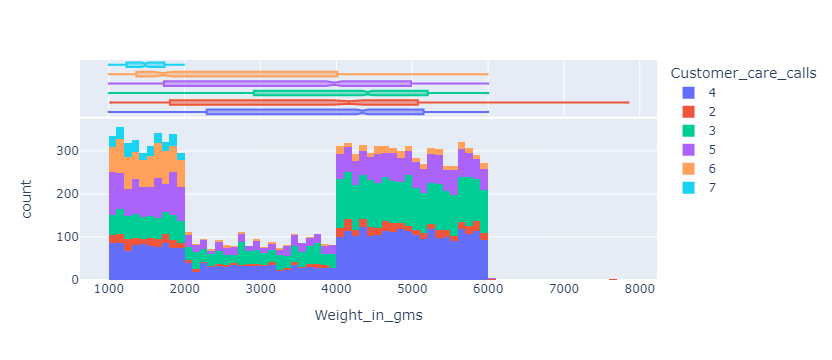

In [90]:
px.histogram(data_frame = df, x = 'Weight_in_gms', nbins = 100, color = 'Customer_care_calls',
             marginal = 'box')

Rekomendasi:

*   Customer yang membeli barang dengan berat yang ringan bisa diberikan notifikasi secara berkala

#### 3.  Semakin customer sering membeli barang maka customer akan semakin sedikit melakukan call

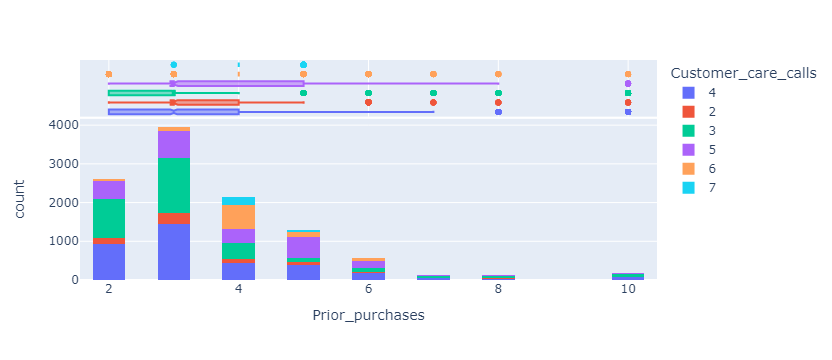

In [91]:
px.histogram(data_frame = df, x = 'Prior_purchases', nbins = 17, color = 'Customer_care_calls',marginal = 'box')

Rekomendasi:

* Customer yang lebih jarang membeli barang bisa diberikan notifikasi secara 
berkala

#### 4.  Customer yang mendapatkan diskon dibawah 10 persen lebih banyak melakukan call dibandingkan customer yang mendapatkan diskon diatas 10 persen

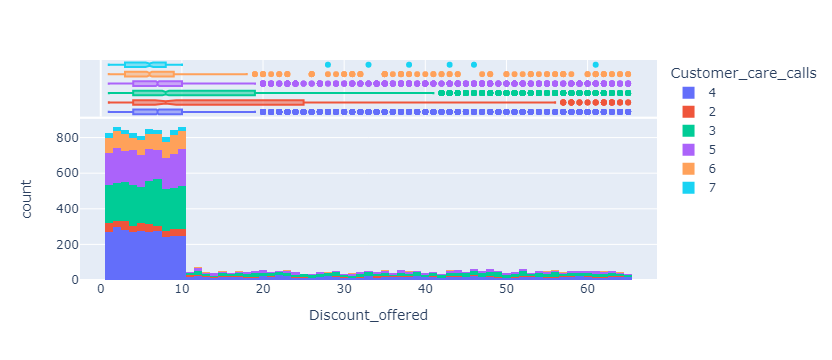

In [92]:
px.histogram(data_frame = df, x = 'Discount_offered', nbins = 100, color = 'Customer_care_calls',
             marginal = 'box')

Rekomendasi

*   Customer yang mendapatkan diskon dibawah 10 persen bisa diberikan notifikasi secara berkala

### Another Insight

In [93]:
insight_1 = df.groupby(['Warehouse_block','Reached.on.Time_Y.N']).agg({'ID': ['count']}).reset_index()
insight_1.columns = ['Warehouse block','Reached on time','count']
insight_1['Reached on time'] = insight_1['Reached on time'].replace([0,1],['Yes','No'])
insight_1

,Warehouse block,Reached on time,count
0,A,Yes,758
1,A,No,1075
2,B,Yes,729
3,B,No,1104
4,C,Yes,739
5,C,No,1094
6,D,Yes,738
7,D,No,1096
8,F,Yes,1472
9,F,No,2194


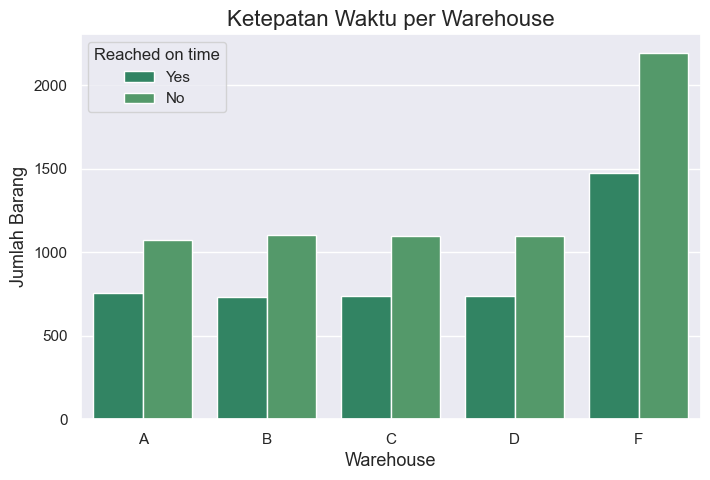

In [94]:
plt.figure(figsize = (8,5))
sns.barplot(x='Warehouse block', y='count', hue='Reached on time', data=insight_1)

plt.title('Ketepatan Waktu per Warehouse',fontsize=16)
plt.xlabel('Warehouse', fontsize=13)
plt.ylabel('Jumlah Barang', fontsize=13)
plt.show()

Another Insight 1 : Pada setiap warehouse selalu ada keterlambatan pengiriman, selain itu penyimpanan barang menumpuk di warehouse block F sesuai dengan univariate analysis pada kolom kategorikal yang telah dibuat pada soal nomor 2. Jadi, direkomendasikan untuk melakukan re-distribusi penyimpanan barang supaya lebih merata pada seluruh warehouse.

In [95]:
insight_2 = df.groupby(['Product_importance','Reached.on.Time_Y.N']).agg({'ID': ['count']}).reset_index()
insight_2.columns = ['Product importance','Reached on time','count']
insight_2 = pd.pivot_table(insight_2,
                          index = ['Product importance'],
                          columns = ['Reached on time'],
                          values = ['count']
                          ).reset_index()
insight_2 = insight_2.reindex([1,2,0]).reset_index(drop=True)
insight_2.columns = ['Product importance','On time','Late']
insight_2['%on time'] = round(insight_2['On time']/(insight_2['On time'] + insight_2['Late'])*100,2)
insight_2['%late']    = round(insight_2['Late']/(insight_2['On time'] + insight_2['Late'])*100,2)
insight_2 = insight_2.drop(['On time','Late'], axis=1)
insight_2

,Product importance,%on time,%late
0,low,40.72,59.28
1,medium,40.95,59.05
2,high,35.02,64.98


<Figure size 900x500 with 0 Axes>

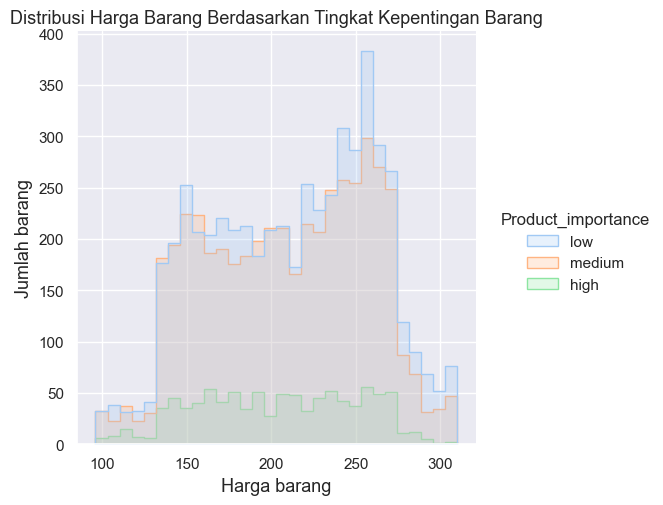

In [96]:
plt.figure(figsize = (9,5))
sns.displot(x='Cost_of_the_Product', hue='Product_importance', data=df, element='step', palette='pastel')

plt.title('Distribusi Harga Barang Berdasarkan Tingkat Kepentingan Barang',fontsize=13)
plt.xlabel('Harga barang', fontsize=13)
plt.ylabel('Jumlah barang', fontsize=13)
plt.show()

Another Insight 2 : Diketahui bahwa barang dengan tingkat kepentingan barang 'low' dan 'medium' memiliki jumlah pemesanan yang tinggi serta diketahui juga bahwa tingkat kepentingan barang tersebut tidak ada kaitannya dengan harga barang.

Kemudian dari tabel persen ketepatan waktu, diketahui bahwa persentase pengiriman yang terlambat hampir sama pada seluruh tingkat kepentingan barang.

Jadi, dengan mempertimbangkan kedua hal tersebut, maka disarankan untuk mengutamakan pengiriman barang dengan tingkat kepentingan 'low' dan 'medium'.

In [97]:
insight_3 = df[['Cost_of_the_Product','Discount_offered','Reached.on.Time_Y.N']]
insight_3['%discount'] = round(insight_3['Discount_offered']/insight_3['Cost_of_the_Product']*100,2)
insight_3['Reached.on.Time_Y.N'] = insight_3['Reached.on.Time_Y.N'].replace([0,1],['Yes','No'])
insight_3

C:\Users\Gloria Yoland S\AppData\Local\Temp\ipykernel_91556\3354935934.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Gloria Yoland S\AppData\Local\Temp\ipykernel_91556\3354935934.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Cost_of_the_Product,Discount_offered,Reached.on.Time_Y.N,%discount
0,177,44,No,24.86
1,216,59,No,27.31
2,183,48,No,26.23
3,176,10,No,5.68
4,184,46,No,25.00
...,...,...,...,...
10994,252,1,No,0.40
10995,232,6,Yes,2.59
10996,242,4,Yes,1.65
10997,223,2,Yes,0.90


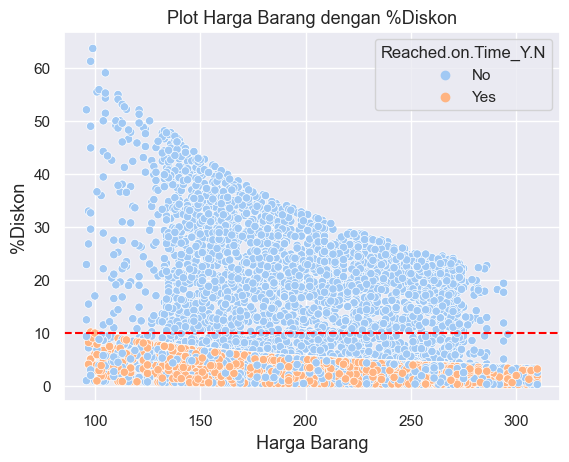

In [98]:
sns.scatterplot(x='Cost_of_the_Product', y='%discount', hue='Reached.on.Time_Y.N', data=insight_3, palette='pastel')

plt.title('Plot Harga Barang dengan %Diskon',fontsize=13)
plt.xlabel('Harga Barang', fontsize=13)
plt.xticks(rotation=0)
plt.ylabel('%Diskon', fontsize=13)
plt.axhline(y=10, color='r', ls='--')
plt.figsize = (20,10)
plt.show()

Another Insight 3 : Dapat dilihat dari grafik diatas bahwa barang yang diberi diskon lebih dari 10% seluruhnya mengalami keterlambatan pengiriman.

Direkomendasikan agar pengiriman untuk barang yang diskon perlu diperhatikan supaya customer tidak berpikiran negatif bahwa perusahaan mengutamakan pengiriman barang dengan diskon kecil.

In [99]:
import matplotlib
print('matplotlib: {}'.format(matplotlib.__version__))

matplotlib: 3.7.0


# <b>Stage 2</b>

## 1. Data Cleansing

### A. Handle Missing Values

In [1]:
import pandas as pd
import numpy as np

In [2]:
df = pd.read_csv("Train.csv") 
df.head()

,ID,Warehouse_block,Mode_of_Shipment,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Gender,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N
0,1,D,Flight,4,2,177,3,low,F,44,1233,1
1,2,F,Flight,4,5,216,2,low,M,59,3088,1
2,3,A,Flight,2,2,183,4,low,M,48,3374,1
3,4,B,Flight,3,3,176,4,medium,M,10,1177,1
4,5,C,Flight,2,2,184,3,medium,F,46,2484,1


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10999 entries, 0 to 10998
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   ID                   10999 non-null  int64 
 1   Warehouse_block      10999 non-null  object
 2   Mode_of_Shipment     10999 non-null  object
 3   Customer_care_calls  10999 non-null  int64 
 4   Customer_rating      10999 non-null  int64 
 5   Cost_of_the_Product  10999 non-null  int64 
 6   Prior_purchases      10999 non-null  int64 
 7   Product_importance   10999 non-null  object
 8   Gender               10999 non-null  object
 9   Discount_offered     10999 non-null  int64 
 10  Weight_in_gms        10999 non-null  int64 
 11  Reached.on.Time_Y.N  10999 non-null  int64 
dtypes: int64(8), object(4)
memory usage: 1.0+ MB


In [4]:
df.isna().sum()

ID                     0
Warehouse_block        0
Mode_of_Shipment       0
Customer_care_calls    0
Customer_rating        0
Cost_of_the_Product    0
Prior_purchases        0
Product_importance     0
Gender                 0
Discount_offered       0
Weight_in_gms          0
Reached.on.Time_Y.N    0
dtype: int64

Dapat dipastikan bahwa data frame yang digunakan tidak memiliki nilai kosong. Sehingga tidak ada penanganan missing value pada data frame.

### B. Handle Duplicated Data

In [5]:
df.duplicated().sum()

0

In [6]:
df.duplicated(subset=['Warehouse_block','Mode_of_Shipment','Customer_care_calls','Customer_rating','Cost_of_the_Product','Prior_purchases','Product_importance','Gender','Discount_offered','Reached.on.Time_Y.N']).sum()

8

In [7]:
df.duplicated(subset=['ID']).sum()

0

In [8]:
df[df.duplicated(subset=['Warehouse_block','Mode_of_Shipment','Customer_care_calls','Customer_rating','Cost_of_the_Product','Prior_purchases','Product_importance','Gender','Discount_offered','Reached.on.Time_Y.N'])]

,ID,Warehouse_block,Mode_of_Shipment,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Gender,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N
3743,3744,F,Ship,4,2,233,2,low,F,5,4817,0
6215,6216,F,Ship,6,5,255,4,low,F,9,1113,0
7569,7570,B,Ship,4,1,155,3,low,F,4,4397,0
7745,7746,F,Ship,6,4,264,4,low,M,1,1711,1
9592,9593,C,Flight,4,3,249,4,medium,M,10,5614,0
10601,10602,F,Ship,3,3,158,3,low,F,6,5261,1
10715,10716,F,Ship,5,2,254,5,medium,F,4,1926,0
10931,10932,F,Ship,4,3,253,5,low,M,6,1366,1


Dari hasil pengecekan duplikat data tidak ditemukan data yang duplikat pada keseluruhan kolom. Akan tetapi kami trial untuk memasukan hanya beberapa kolom kecuali kolom ID, lalu ditemukan terdapat 8 baris yang memiliki beberapa kesamaan. Namun hal tersebut tidak perlu dilakukan drop duplicated karena kesamaan hanya pada beberapa value saja. Sehingga dalam tahapan ini tidak perlu dilakukan drop duplicated data pada data frame.

### C. Handle Outliers

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt
pal = sns.color_palette()
from scipy import stats
from sklearn.preprocessing import MinMaxScaler, StandardScaler

In [10]:
from matplotlib import rcParams
rcParams['figure.figsize'] = 12, 7
rcParams['lines.linewidth'] = 3
rcParams['xtick.labelsize'] = 'x-large'
rcParams['ytick.labelsize'] = 'x-large'

In [11]:
df.describe()

,ID,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N
count,10999.00000,10999.000000,10999.000000,10999.000000,10999.000000,10999.000000,10999.000000,10999.000000
mean,5500.00000,4.054459,2.990545,210.196836,3.567597,13.373216,3634.016729,0.596691
std,3175.28214,1.141490,1.413603,48.063272,1.522860,16.205527,1635.377251,0.490584
min,1.00000,2.000000,1.000000,96.000000,2.000000,1.000000,1001.000000,0.000000
25%,2750.50000,3.000000,2.000000,169.000000,3.000000,4.000000,1839.500000,0.000000
50%,5500.00000,4.000000,3.000000,214.000000,3.000000,7.000000,4149.000000,1.000000
75%,8249.50000,5.000000,4.000000,251.000000,4.000000,10.000000,5050.000000,1.000000
max,10999.00000,7.000000,5.000000,310.000000,10.000000,65.000000,7846.000000,1.000000


In [12]:
# memisahkan kolom numeric dan categorical
nums = ['Customer_care_calls','Customer_rating','Cost_of_the_Product','Prior_purchases','Discount_offered','Weight_in_gms','Reached.on.Time_Y.N']
cats = ['Warehouse_block','Mode_of_Shipment','Product_importance','Gender']

<b>Melihat outlier pada setiap kolom, sebelumnya pada stage 1 didapatkan outlier pada 2 kolom yaitu kolom prior purchases dan discount offered</b>

In [13]:
# Prior_purchases
Q1 = df['Prior_purchases'].quantile(0.25)
Q3 = df['Prior_purchases'].quantile(0.75)
IQR = Q3 - Q1
low_limit= Q1 - (1.5 * IQR)
high_limit = Q3 + (1.5 * IQR)
filtered_entries = ((df['Prior_purchases'] >= low_limit) & (df['Prior_purchases'] <= high_limit))
df = df[filtered_entries]

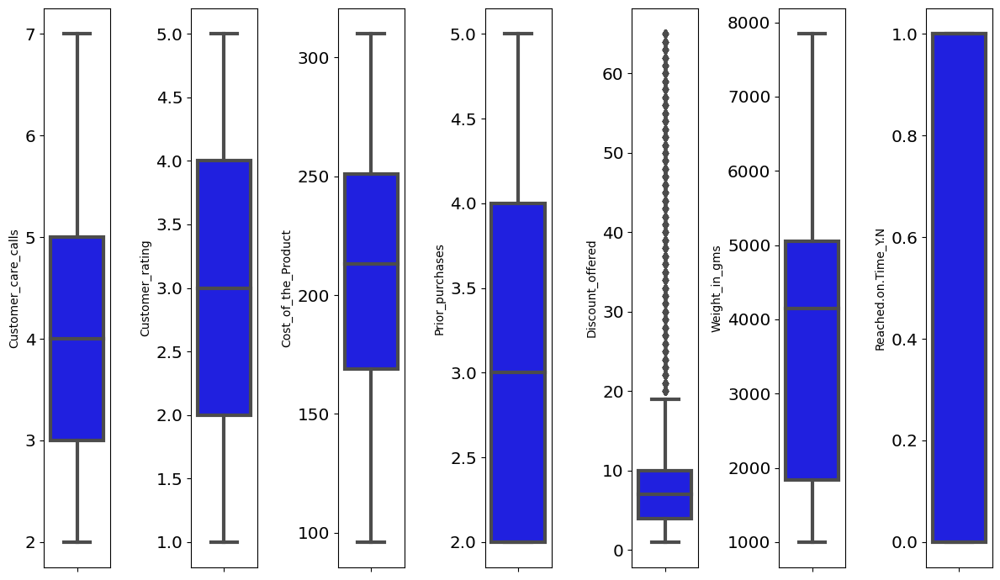

In [14]:
features = nums
for i in range(0, len(features)):
  plt.subplot(1, len(features), i+1)
  sns.boxplot(y = df[features[i]], color='blue', orient='v')
  plt.tight_layout()

Setelah dilakukan Handling Outliers, feature Prior_purchases sudah tidak ada outliers, tetapi untuk feature Discount_offered tetap terlihat outliers. Oleh karena itu, feature Discount_offered akan dilakukan log transformation agar distribusi menjadi normal.

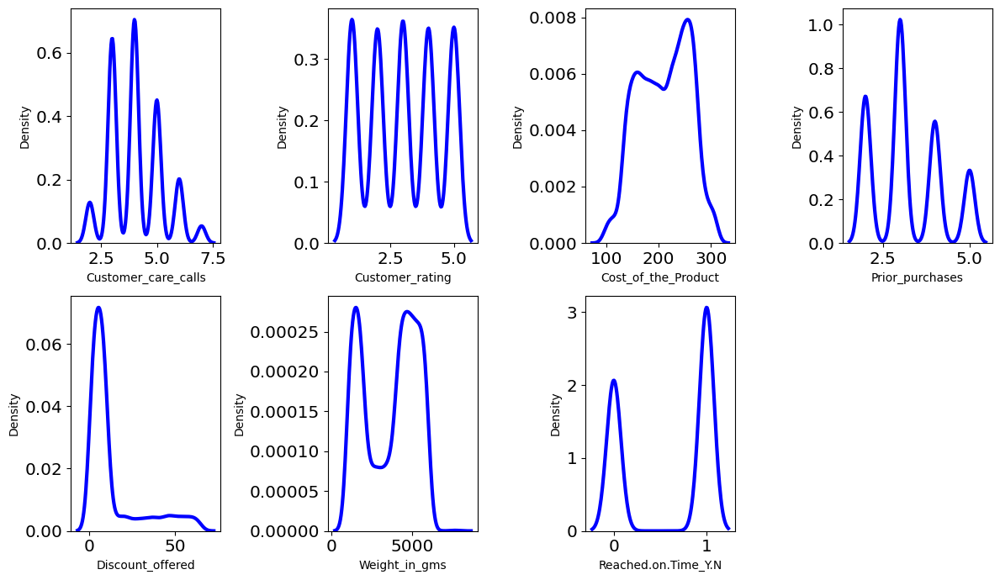

In [15]:
features = nums
for i in range(0, len(features)):
  plt.subplot(2,4, i+1)
  sns.kdeplot(x = df[features[i]], color='blue')
  plt.xlabel(features[i])
  plt.tight_layout()

### D. Feature Transformation

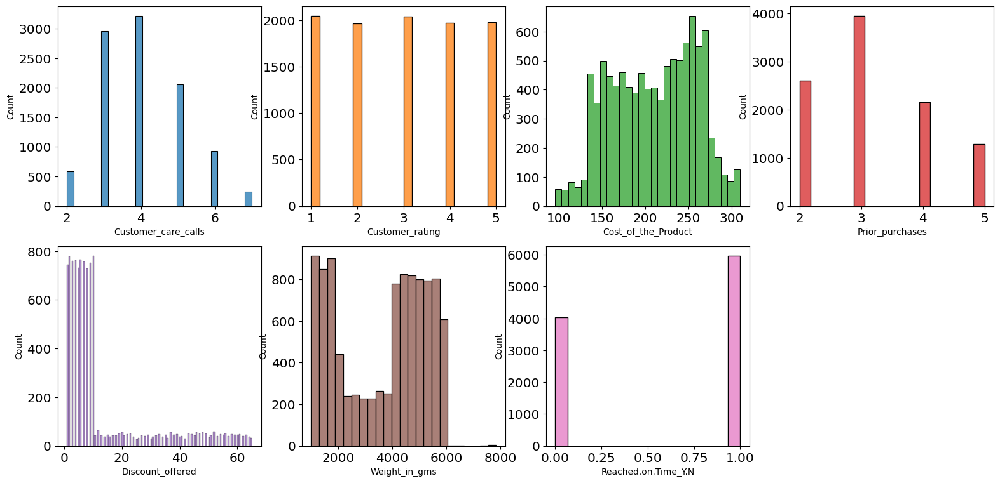

In [16]:
plt.figure(figsize = (19, 9))
for i, num in enumerate(nums):

    plt.subplot(2,4, i+1)
    sns.histplot(df[num], color=pal[i])
    
plt.show()

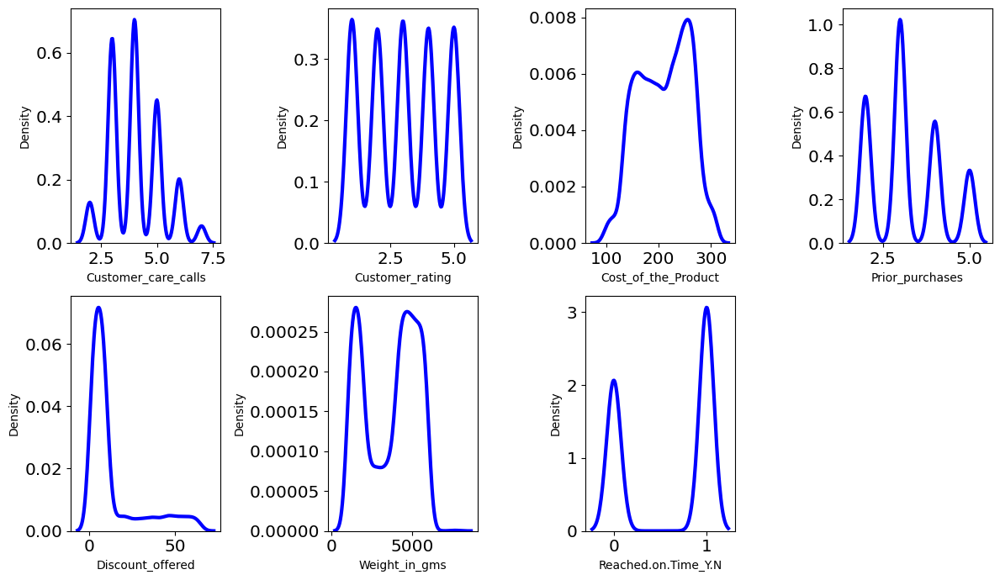

In [17]:
features = nums
for i in range(0, len(features)):
  plt.subplot(2,4, i+1)
  sns.kdeplot(x = df[features[i]], color='blue')
  plt.xlabel(features[i])
  plt.tight_layout()

In [18]:
# Normalization dan Standardization
df['Cost_of_the_Product_norm'] = MinMaxScaler().fit_transform(df['Cost_of_the_Product'].values.reshape(len(df), 1))
df['Cost_of_the_Product_std'] = StandardScaler().fit_transform(df['Cost_of_the_Product'].values.reshape(len(df), 1))

In [19]:
df[['Cost_of_the_Product','Cost_of_the_Product_norm', 'Cost_of_the_Product_std']].describe()

,Cost_of_the_Product,Cost_of_the_Product_norm,Cost_of_the_Product_std
count,9996.000000,9996.000000,9.996000e+03
mean,210.123149,0.533286,-1.484518e-16
std,48.155901,0.225028,1.000050e+00
min,96.000000,0.000000,-2.369987e+00
25%,169.000000,0.341121,-8.540014e-01
50%,213.000000,0.546729,5.974335e-02
75%,251.000000,0.724299,8.488865e-01
max,310.000000,1.000000,2.074135e+00


<AxesSubplot:xlabel='Discount_offered', ylabel='Density'>

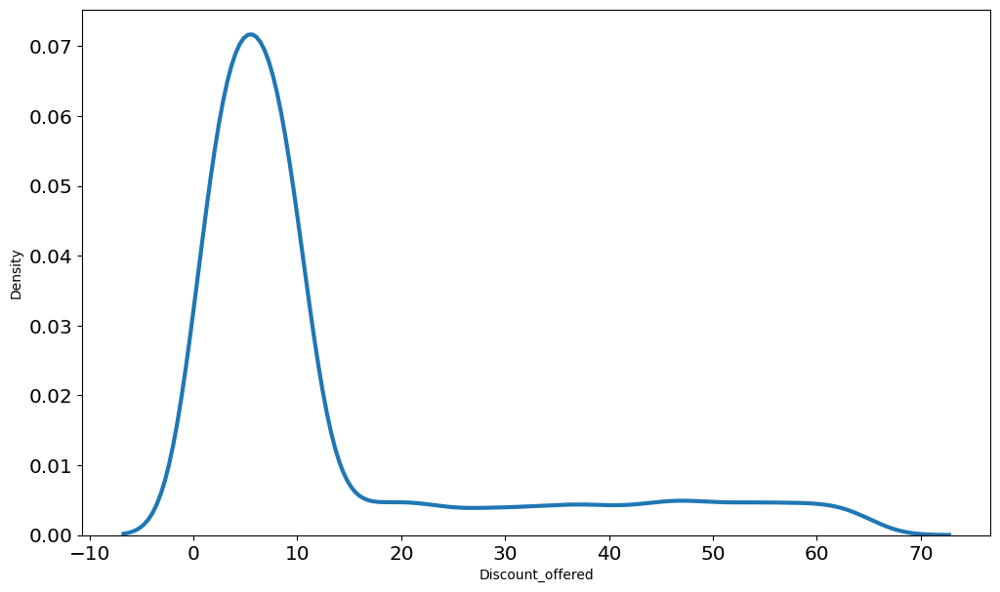

In [20]:
#Sebelum dilakukan Log Transformation
sns.kdeplot(df['Discount_offered'])

<AxesSubplot:xlabel='Discount_offered', ylabel='Density'>

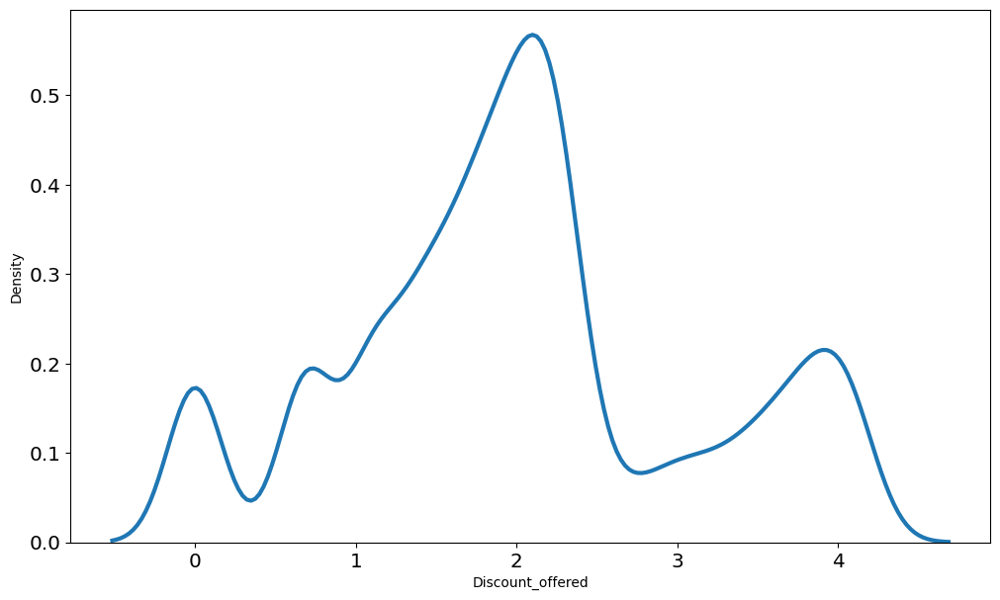

In [21]:
#Setelah dilakukan log transformation
sns.kdeplot(np.log(df['Discount_offered']))

In [22]:
df['Discount_offered'] = np.log(df['Discount_offered'])

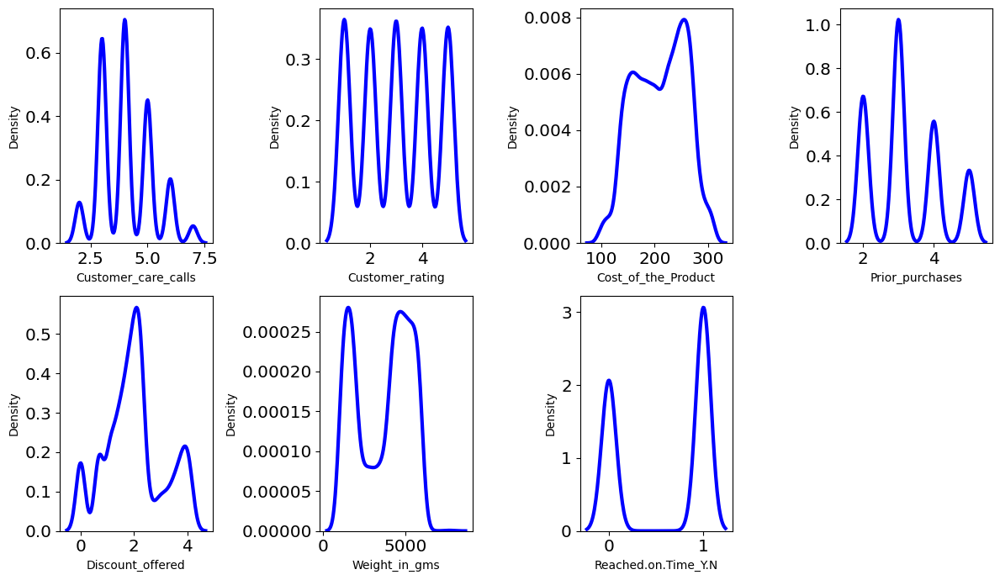

In [23]:
features = nums
for i in range(0, len(features)):
  plt.subplot(2,4, i+1)
  sns.kdeplot(x = df[features[i]], color='blue')
  plt.xlabel(features[i])
  plt.tight_layout()

Terlihat bahwa hasil distribusi pada feature discount_offered setelah dilakukan log transformation menjadi normal karena pada sebelumnya terlihat bahwa distribusinya terlihat right skewed.

### E. Feature Encoding

In [24]:
print('Warehouse_block')
print(df['Warehouse_block'].unique())
print('\n')
print('Mode_of_Shipment')
print(df['Mode_of_Shipment'].unique())
print('\n')
print('Product_importance')
print(df['Product_importance'].unique())
print('\n')
print('Gender')
print(df['Gender'].unique())

Warehouse_block
['D' 'F' 'A' 'B' 'C']


Mode_of_Shipment
['Flight' 'Ship' 'Road']


Product_importance
['low' 'medium' 'high']


Gender
['F' 'M']


In [25]:
df[nums].describe()

,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N
count,9996.000000,9996.000000,9996.000000,9996.000000,9996.000000,9996.000000,9996.000000
mean,4.052321,2.986495,210.123149,3.213085,2.002975,3635.647959,0.597439
std,1.151272,1.415952,48.155901,0.972258,1.085346,1635.854290,0.490438
min,2.000000,1.000000,96.000000,2.000000,0.000000,1001.000000,0.000000
25%,3.000000,2.000000,169.000000,2.000000,1.386294,1837.750000,0.000000
50%,4.000000,3.000000,213.000000,3.000000,1.945910,4147.500000,1.000000
75%,5.000000,4.000000,251.000000,4.000000,2.302585,5054.000000,1.000000
max,7.000000,5.000000,310.000000,5.000000,4.174387,7846.000000,1.000000


In [26]:
df[cats].describe()

,Warehouse_block,Mode_of_Shipment,Product_importance,Gender
count,9996,9996,9996,9996
unique,5,3,3,2
top,F,Ship,low,F
freq,3335,6783,4910,5035


In [27]:
# Label Encoding pada kolom Product_importance dan Gender
df['Product_importance'] = df['Product_importance'].astype('category').cat.codes
df['Gender'] = df['Gender'].astype('category').cat.codes

In [28]:
# One Hot Encoding pada kolom Warehouse_block dan Mode_of_Shipment
# WARNING: run code ini sekali saja
for cat in ['Warehouse_block','Mode_of_Shipment']:
    onehots = pd.get_dummies(df[cat], prefix=cat)
    df = df.join(onehots)

In [29]:
df

,ID,Warehouse_block,Mode_of_Shipment,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Gender,Discount_offered,...,Cost_of_the_Product_norm,Cost_of_the_Product_std,Warehouse_block_A,Warehouse_block_B,Warehouse_block_C,Warehouse_block_D,Warehouse_block_F,Mode_of_Shipment_Flight,Mode_of_Shipment_Road,Mode_of_Shipment_Ship
0,1,D,Flight,4,2,177,3,1,0,3.784190,...,0.378505,-0.687866,0,0,0,1,0,1,0,0
1,2,F,Flight,4,5,216,2,1,1,4.077537,...,0.560748,0.122044,0,0,0,0,1,1,0,0
2,3,A,Flight,2,2,183,4,1,1,3.871201,...,0.406542,-0.563264,1,0,0,0,0,1,0,0
3,4,B,Flight,3,3,176,4,2,1,2.302585,...,0.373832,-0.708633,0,1,0,0,0,1,0,0
4,5,C,Flight,2,2,184,3,2,0,3.828641,...,0.411215,-0.542497,0,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10992,10993,D,Ship,5,1,236,5,2,1,1.098612,...,0.654206,0.537383,0,0,0,1,0,0,0,1
10994,10995,A,Ship,4,1,252,5,2,0,0.000000,...,0.728972,0.869653,1,0,0,0,0,0,0,1
10995,10996,B,Ship,4,1,232,5,2,0,1.791759,...,0.635514,0.454315,0,1,0,0,0,0,0,1
10996,10997,C,Ship,5,4,242,5,1,0,1.386294,...,0.682243,0.661984,0,0,1,0,0,0,0,1


In [30]:
# drop kolom Warehouse_block dan Mode_of_Shipment yang asli (karena sudah di-encoding)
df_new = df.drop(columns=['Warehouse_block','Mode_of_Shipment']).copy()

In [31]:
df_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9996 entries, 0 to 10998
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        9996 non-null   int64  
 1   Customer_care_calls       9996 non-null   int64  
 2   Customer_rating           9996 non-null   int64  
 3   Cost_of_the_Product       9996 non-null   int64  
 4   Prior_purchases           9996 non-null   int64  
 5   Product_importance        9996 non-null   int8   
 6   Gender                    9996 non-null   int8   
 7   Discount_offered          9996 non-null   float64
 8   Weight_in_gms             9996 non-null   int64  
 9   Reached.on.Time_Y.N       9996 non-null   int64  
 10  Cost_of_the_Product_norm  9996 non-null   float64
 11  Cost_of_the_Product_std   9996 non-null   float64
 12  Warehouse_block_A         9996 non-null   uint8  
 13  Warehouse_block_B         9996 non-null   uint8  
 14  Warehou

### F. Handle Class Imbalance

In [32]:
!pip install imblearn

In [33]:
# membuat target baru
df_new['Target'] = df_new['Reached.on.Time_Y.N'] == 1
df_new['Target'].value_counts()

True     5972
False    4024
Name: Target, dtype: int64

In [34]:
# memisahkan features dan target kedalam variabel x dan y
x = df_new.drop(['Reached.on.Time_Y.N'],axis=1)
y = df_new['Target'].values
print(x.shape)
print(y.shape)

(9996, 20)
(9996,)


In [35]:
from imblearn import under_sampling, over_sampling

# Undersampling
x_under, y_under = under_sampling.RandomUnderSampler().fit_resample(x, y)

# Oversampling
x_over, y_over = over_sampling.RandomOverSampler().fit_resample(x, y)

# SMOTE
x_over_SMOTE, y_over_SMOTE = over_sampling.SMOTE().fit_resample(x, y)

In [36]:
print('Original')
print(pd.Series(y).value_counts())
print('\n')
print('Undersampling')
print(pd.Series(y_under).value_counts())
print('\n')
print('Oversampling')
print(pd.Series(y_over).value_counts())
print('\n')
print('SMOTE')
print(pd.Series(y_over_SMOTE).value_counts())

Original
True     5972
False    4024
dtype: int64


Undersampling
False    4024
True     4024
dtype: int64


Oversampling
True     5972
False    5972
dtype: int64


SMOTE
True     5972
False    5972
dtype: int64


## 2. Feature Engineering

### A. Feature Selection

In [37]:
feat_train=['Warehouse_block',
 'Mode_of_Shipment',
 'Product_importance',
 'Gender',
 'Customer_care_calls',
 'Cost_of_the_Product',
 'Prior_purchases',
 'Discount_offered',
 'Weight_in_gms',
 'Reached.on.Time_Y.N']

In [38]:
df['Reached.on.Time_Y.N']=df['Reached.on.Time_Y.N'].astype('int')

In [39]:
# import packages
import pandas.core.algorithms as algos
from pandas import Series
import scipy.stats.stats as stats
import re
import traceback
import string

pd.options.display.float_format = '{:.3f}'.format

max_bin = 10
force_bin = 3

# define a binning function
def mono_bin(Y, X, n = max_bin):
    
    df1 = pd.DataFrame({"X": X, "Y": Y})
    justmiss = df1[['X','Y']][df1.X.isnull()]
    notmiss = df1[['X','Y']][df1.X.notnull()]
    r = 0
    while np.abs(r) < 1:
        try:
            d1 = pd.DataFrame({"X": notmiss.X, "Y": notmiss.Y, "Bucket": pd.qcut(notmiss.X, n)})
            d2 = d1.groupby('Bucket', as_index=True)
            r, p = stats.spearmanr(d2.mean().X, d2.mean().Y)
            n = n - 1 
        except Exception as e:
            n = n - 1

    if len(d2) == 1:
        n = force_bin         
        bins = algos.quantile(notmiss.X, np.linspace(0, 1, n))
        if len(np.unique(bins)) == 2:
            bins = np.insert(bins, 0, 1)
            bins[1] = bins[1]-(bins[1]/2)
        d1 = pd.DataFrame({"X": notmiss.X, "Y": notmiss.Y, "Bucket": pd.cut(notmiss.X, np.unique(bins),include_lowest=True)}) 
        d2 = d1.groupby('Bucket', as_index=True)
    
    d3 = pd.DataFrame({},index=[])
    d3["MIN_VALUE"] = d2.min().X
    d3["MAX_VALUE"] = d2.max().X
    d3["COUNT"] = d2.count().Y
    d3["EVENT"] = d2.sum().Y
    d3["NONEVENT"] = d2.count().Y - d2.sum().Y
    d3=d3.reset_index(drop=True)
    
    if len(justmiss.index) > 0:
        d4 = pd.DataFrame({'MIN_VALUE':np.nan},index=[0])
        d4["MAX_VALUE"] = np.nan
        d4["COUNT"] = justmiss.count().Y
        d4["EVENT"] = justmiss.sum().Y
        d4["NONEVENT"] = justmiss.count().Y - justmiss.sum().Y
        d3 = d3.append(d4,ignore_index=True)
    
    d3["EVENT_RATE"] = d3.EVENT/d3.COUNT
    d3["NON_EVENT_RATE"] = d3.NONEVENT/d3.COUNT
    d3["DIST_EVENT"] = d3.EVENT/d3.sum().EVENT
    d3["DIST_NON_EVENT"] = d3.NONEVENT/d3.sum().NONEVENT
    d3["WOE"] = np.log(d3.DIST_EVENT/d3.DIST_NON_EVENT)
    d3["IV"] = (d3.DIST_EVENT-d3.DIST_NON_EVENT)*np.log(d3.DIST_EVENT/d3.DIST_NON_EVENT)
    d3["VAR_NAME"] = "VAR"
    d3 = d3[['VAR_NAME','MIN_VALUE', 'MAX_VALUE', 'COUNT', 'EVENT', 'EVENT_RATE', 'NONEVENT', 'NON_EVENT_RATE', 'DIST_EVENT','DIST_NON_EVENT','WOE', 'IV']]       
    d3 = d3.replace([np.inf, -np.inf], 0)
    d3.IV = d3.IV.sum()
    
    return(d3)

def char_bin(Y, X):
        
    df1 = pd.DataFrame({"X": X, "Y": Y})
    justmiss = df1[['X','Y']][df1.X.isnull()]
    notmiss = df1[['X','Y']][df1.X.notnull()]    
    df2 = notmiss.groupby('X',as_index=True)
    
    d3 = pd.DataFrame({},index=[])
    d3["COUNT"] = df2.count().Y
    d3["MIN_VALUE"] = df2.sum().Y.index
    d3["MAX_VALUE"] = d3["MIN_VALUE"]
    d3["EVENT"] = df2.sum().Y
    d3["NONEVENT"] = df2.count().Y - df2.sum().Y
    
    if len(justmiss.index) > 0:
        d4 = pd.DataFrame({'MIN_VALUE':np.nan},index=[0])
        d4["MAX_VALUE"] = np.nan
        d4["COUNT"] = justmiss.count().Y
        d4["EVENT"] = justmiss.sum().Y
        d4["NONEVENT"] = justmiss.count().Y - justmiss.sum().Y
        d3 = d3.append(d4,ignore_index=True)
    
    d3["EVENT_RATE"] = d3.EVENT/d3.COUNT
    d3["NON_EVENT_RATE"] = d3.NONEVENT/d3.COUNT
    d3["DIST_EVENT"] = d3.EVENT/d3.sum().EVENT
    d3["DIST_NON_EVENT"] = d3.NONEVENT/d3.sum().NONEVENT
    d3["WOE"] = np.log(d3.DIST_EVENT/d3.DIST_NON_EVENT)
    d3["IV"] = (d3.DIST_EVENT-d3.DIST_NON_EVENT)*np.log(d3.DIST_EVENT/d3.DIST_NON_EVENT)
    d3["VAR_NAME"] = "VAR"
    d3 = d3[['VAR_NAME','MIN_VALUE', 'MAX_VALUE', 'COUNT', 'EVENT', 'EVENT_RATE', 'NONEVENT', 'NON_EVENT_RATE', 'DIST_EVENT','DIST_NON_EVENT','WOE', 'IV']]      
    d3 = d3.replace([np.inf, -np.inf], 0)
    d3.IV = d3.IV.sum()
    d3 = d3.reset_index(drop=True)
    
    return(d3)

def data_vars(df1, target):
    
    stack = traceback.extract_stack()
    filename, lineno, function_name, code = stack[-2]
    vars_name = re.compile(r'\((.*?)\).*$').search(code).groups()[0]
    final = (re.findall(r"[\w']+", vars_name))[-1]
    
    x = df1.dtypes.index
    count = -1
    
    for i in x:
        if i.upper() not in (final.upper()):
            if np.issubdtype(df1[i], np.number) and len(Series.unique(df1[i])) > 2:
                conv = mono_bin(target, df1[i])
                conv["VAR_NAME"] = i
                count = count + 1
            else:
                conv = char_bin(target, df1[i])
                conv["VAR_NAME"] = i            
                count = count + 1
                
            if count == 0:
                iv_df = conv
            else:
                iv_df = iv_df.append(conv,ignore_index=True)
    
    iv = pd.DataFrame({'IV':iv_df.groupby('VAR_NAME').IV.max()})
    iv = iv.reset_index()
    return(iv_df,iv)

In [40]:
df.columns

Index(['ID', 'Warehouse_block', 'Mode_of_Shipment', 'Customer_care_calls',
       'Customer_rating', 'Cost_of_the_Product', 'Prior_purchases',
       'Product_importance', 'Gender', 'Discount_offered', 'Weight_in_gms',
       'Reached.on.Time_Y.N', 'Cost_of_the_Product_norm',
       'Cost_of_the_Product_std', 'Warehouse_block_A', 'Warehouse_block_B',
       'Warehouse_block_C', 'Warehouse_block_D', 'Warehouse_block_F',
       'Mode_of_Shipment_Flight', 'Mode_of_Shipment_Road',
       'Mode_of_Shipment_Ship'],
      dtype='object')

In [41]:
feat=['Warehouse_block', 'Mode_of_Shipment', 'Customer_care_calls',
       'Customer_rating', 'Cost_of_the_Product', 'Prior_purchases',
       'Product_importance', 'Gender', 'Discount_offered', 'Weight_in_gms']

In [42]:
final_iv, IV =data_vars(df[feat], df['Reached.on.Time_Y.N'])

C:\Users\Gloria Yoland S\AppData\Local\Temp\ipykernel_93572\186763841.py:25: DeprecationWarning: Please use `spearmanr` from the `scipy.stats` namespace, the `scipy.stats.stats` namespace is deprecated.
  r, p = stats.spearmanr(d2.mean().X, d2.mean().Y)


In [43]:
final_iv

,VAR_NAME,MIN_VALUE,MAX_VALUE,COUNT,EVENT,EVENT_RATE,NONEVENT,NON_EVENT_RATE,DIST_EVENT,DIST_NON_EVENT,WOE,IV
0,Warehouse_block,A,A,1674,974,0.582,700,0.418,0.163,0.174,-0.064,0.001
1,Warehouse_block,B,B,1659,1012,0.610,647,0.390,0.169,0.161,0.053,0.001
2,Warehouse_block,C,C,1669,991,0.594,678,0.406,0.166,0.168,-0.015,0.001
3,Warehouse_block,D,D,1659,1005,0.606,654,0.394,0.168,0.163,0.035,0.001
4,Warehouse_block,F,F,3335,1990,0.597,1345,0.403,0.333,0.334,-0.003,0.001
5,Mode_of_Shipment,Flight,Flight,1628,983,0.604,645,0.396,0.165,0.160,0.027,0.000
6,Mode_of_Shipment,Road,Road,1585,936,0.591,649,0.409,0.157,0.161,-0.029,0.000
7,Mode_of_Shipment,Ship,Ship,6783,4053,0.598,2730,0.402,0.679,0.678,0.000,0.000
8,Customer_care_calls,2,3,3541,2237,0.632,1304,0.368,0.375,0.324,0.145,0.024
9,Customer_care_calls,4,4,3222,1929,0.599,1293,0.401,0.323,0.321,0.005,0.024


In [44]:
IV.sort_values('IV', ascending=False)

,VAR_NAME,IV
3,Discount_offered,0.310
9,Weight_in_gms,0.270
6,Prior_purchases,0.048
1,Customer_care_calls,0.024
0,Cost_of_the_Product,0.019
8,Warehouse_block,0.001
2,Customer_rating,0.001
7,Product_importance,0.001
5,Mode_of_Shipment,0.000
4,Gender,0.000


Sebelumnya telah diketahui adanya korelasi yang relevan antara <b>Reached On Time</b> dan <b>Weight</b> serta <b>Discount Offered</b>.

Kami coba mengecek ulang apakah ada korelasi dengan fitur categorical setelah diencoding. 

Ternyata  ada jadi fitur yang bisa dipakai, berdasar metode IV feature selection kolom yang relevan terhadap <b>Reach on time</b> adalah

1. Discount_offered
2. Weight_in_gms
3. Customer_care_calls
4. Prior_purchases
5. Cost_of_the_Product

Selain itu kita akan membuang kolom yang tidak terpakai (yang kita namai dengan df_select).

In [45]:
df_select=df_new.drop(columns=['Customer_rating', 'Gender','Warehouse_block_A','Warehouse_block_C','Warehouse_block_D','Warehouse_block_F','Mode_of_Shipment_Flight','Mode_of_Shipment_Road', 'Mode_of_Shipment_Ship','Reached.on.Time_Y.N'])
df_selectdf_select=df_new.drop(columns=['Customer_rating', 'Gender','Warehouse_block_A','Warehouse_block_C','Warehouse_block_D','Warehouse_block_F','Mode_of_Shipment_Flight','Mode_of_Shipment_Road', 'Mode_of_Shipment_Ship','Reached.on.Time_Y.N'])
df_select

,ID,Customer_care_calls,Cost_of_the_Product,Prior_purchases,Product_importance,Discount_offered,Weight_in_gms,Cost_of_the_Product_norm,Cost_of_the_Product_std,Warehouse_block_B,Target
0,1,4,177,3,1,3.784,1233,0.379,-0.688,0,True
1,2,4,216,2,1,4.078,3088,0.561,0.122,0,True
2,3,2,183,4,1,3.871,3374,0.407,-0.563,0,True
3,4,3,176,4,2,2.303,1177,0.374,-0.709,1,True
4,5,2,184,3,2,3.829,2484,0.411,-0.542,0,True
...,...,...,...,...,...,...,...,...,...,...,...
10992,10993,5,236,5,2,1.099,1906,0.654,0.537,0,False
10994,10995,4,252,5,2,0.000,1538,0.729,0.870,0,True
10995,10996,4,232,5,2,1.792,1247,0.636,0.454,1,False
10996,10997,5,242,5,1,1.386,1155,0.682,0.662,0,False


### B. Feature Extraction

In [46]:
df_extract=df_select.copy()

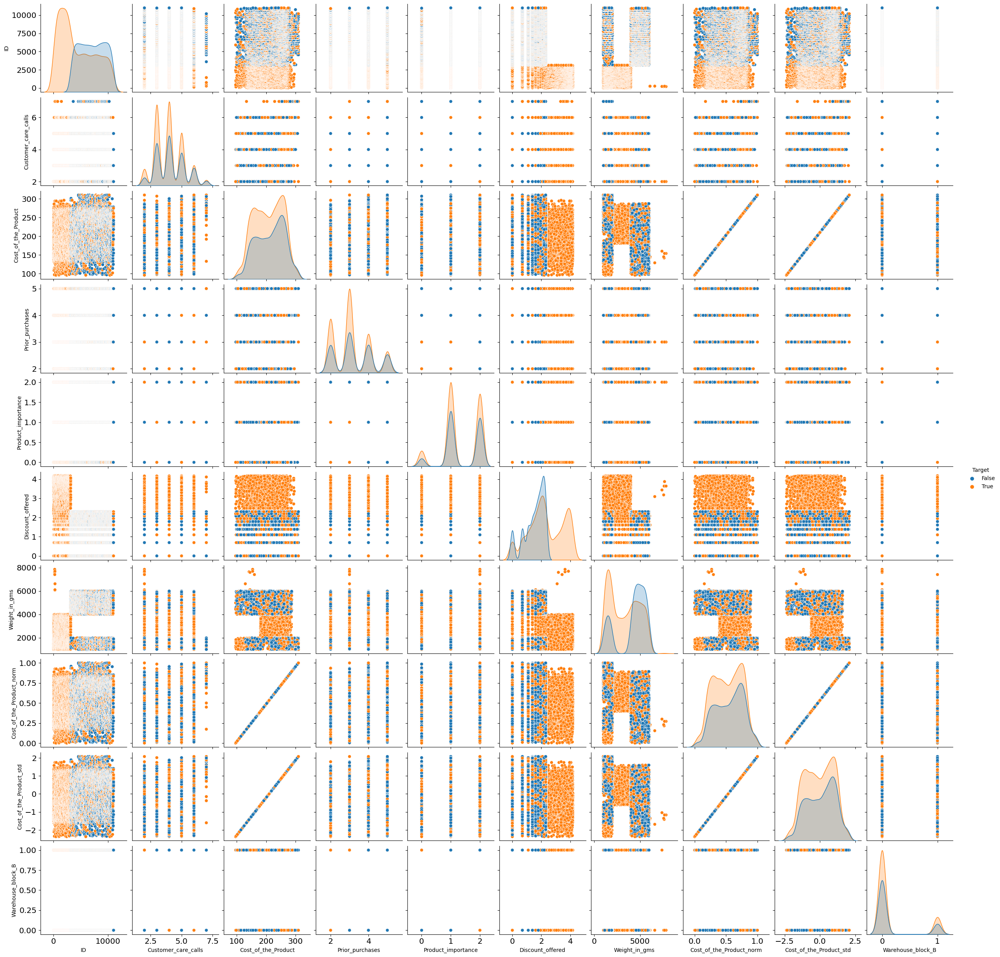

In [47]:
sns.pairplot(df_extract, hue='Target')

#### Diskon

Karena diskon diatas 10 persen tidak ada yang reach on time

In [48]:
df_noreach = df_new[df_new['Reached.on.Time_Y.N']== 1]
df_reach = df_new[df_new['Reached.on.Time_Y.N']== 0]
df_reach['Discount_offered'].max()

2.302585092994046

In [49]:
# Feature Diskon, 0 = diskon dibawah 10% & 1 = 0 = diskon diatas 10%
def diskon(x):
    try:
        if x['Discount_offered'] <= 2.302585092994046:
          diskon = 0
        else:
          diskon = 1
        return diskon
    except:
        pass

In [50]:
df_new['Diskon'] = df_new.apply(lambda x: diskon(x), axis=1)

#### Weight

Karena berat barang diatas 2000gr sampai 4000gr tidak ada yang reach on time

In [51]:
df_reach_a = df_reach[df_reach['Weight_in_gms'] < 3000]
df_reach_b = df_reach[df_reach['Weight_in_gms'] > 3000]
print(df_reach_b['Weight_in_gms'].min())
print(df_reach_a['Weight_in_gms'].max())

4000
2000


In [52]:
def berat(x):
    try:
        if x['Weight_in_gms'] < 4000:
          berat = 1
        elif x['Weight_in_gms'] <= 2000:
          berat = 0
        else:
          berat = 0
        return berat
    except:
        pass

In [53]:
df_new['Weight'] = df_new.apply(lambda x: berat(x), axis=1)

#### Cost

Karena cost dibawah 130 dan dan berat dibawah 1959gr tidak ada yang reach

In [54]:
print(df_reach_a['Cost_of_the_Product'].min())

130


In [55]:
df_noreach_a = df_noreach[df_noreach['Cost_of_the_Product'] < 130]
df_noreach_ab = df_noreach_a[df_noreach_a['Weight_in_gms'] < 3000]
print(df_noreach_ab['Weight_in_gms'].max())

1959


In [56]:
def cost(x):
    try:
        if x['Cost_of_the_Product'] < 130 and x['Weight_in_gms'] <= 1959:
          cost = 1
        else:
          cost = 0
        return cost
    except:
        pass

In [57]:
df_new['Cost'] = df_new.apply(lambda x: cost(x), axis=1)

In [58]:
df_new

,ID,Customer_care_calls,Customer_rating,Cost_of_the_Product,Prior_purchases,Product_importance,Gender,Discount_offered,Weight_in_gms,Reached.on.Time_Y.N,...,Warehouse_block_C,Warehouse_block_D,Warehouse_block_F,Mode_of_Shipment_Flight,Mode_of_Shipment_Road,Mode_of_Shipment_Ship,Target,Diskon,Weight,Cost
0,1,4,2,177,3,1,0,3.784,1233,1,...,0,1,0,1,0,0,True,1,1,0
1,2,4,5,216,2,1,1,4.078,3088,1,...,0,0,1,1,0,0,True,1,1,0
2,3,2,2,183,4,1,1,3.871,3374,1,...,0,0,0,1,0,0,True,1,1,0
3,4,3,3,176,4,2,1,2.303,1177,1,...,0,0,0,1,0,0,True,0,1,0
4,5,2,2,184,3,2,0,3.829,2484,1,...,1,0,0,1,0,0,True,1,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10992,10993,5,1,236,5,2,1,1.099,1906,0,...,0,1,0,0,0,1,False,0,1,0
10994,10995,4,1,252,5,2,0,0.000,1538,1,...,0,0,0,0,0,1,True,0,1,0
10995,10996,4,1,232,5,2,0,1.792,1247,0,...,0,0,0,0,0,1,False,0,1,0
10996,10997,5,4,242,5,1,0,1.386,1155,0,...,1,0,0,0,0,1,False,0,1,0


In [73]:
#Menghapus Fitur yang kurang relevan dan double yaitu yang nilai IV dibawah 0.001 dan menghapus weight in gms, cost of the product dan cost of the product norm) 
df_select=df_new.drop(columns=['Cost_of_the_Product_std', 'Cost_of_the_Product_norm','ID','Product_importance','Warehouse_block_B','Customer_rating', 'Gender','Warehouse_block_A','Warehouse_block_C','Warehouse_block_D','Warehouse_block_F','Mode_of_Shipment_Flight','Mode_of_Shipment_Road', 'Mode_of_Shipment_Ship', 'Reached.on.Time_Y.N','Diskon','Weight','Cost'])
df_select

,Customer_care_calls,Cost_of_the_Product,Prior_purchases,Discount_offered,Weight_in_gms,Target
0,4,177,3,3.784,1233,True
1,4,216,2,4.078,3088,True
2,2,183,4,3.871,3374,True
3,3,176,4,2.303,1177,True
4,2,184,3,3.829,2484,True
...,...,...,...,...,...,...
10992,5,236,5,1.099,1906,False
10994,4,252,5,0.000,1538,True
10995,4,232,5,1.792,1247,False
10996,5,242,5,1.386,1155,False


# <b>Stage 3</b>

## 1. Modeling

### Split Data Train & Test

In [74]:
df_select.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9996 entries, 0 to 10998
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Customer_care_calls  9996 non-null   int64  
 1   Cost_of_the_Product  9996 non-null   int64  
 2   Prior_purchases      9996 non-null   int64  
 3   Discount_offered     9996 non-null   float64
 4   Weight_in_gms        9996 non-null   int64  
 5   Target               9996 non-null   bool   
dtypes: bool(1), float64(1), int64(4)
memory usage: 736.4 KB


In [75]:
new_df_select = df_select.copy()
new_df_select.describe()

,Customer_care_calls,Cost_of_the_Product,Prior_purchases,Discount_offered,Weight_in_gms
count,9996.000,9996.000,9996.000,9996.000,9996.000
mean,4.052,210.123,3.213,2.003,3635.648
std,1.151,48.156,0.972,1.085,1635.854
min,2.000,96.000,2.000,0.000,1001.000
25%,3.000,169.000,2.000,1.386,1837.750
50%,4.000,213.000,3.000,1.946,4147.500
75%,5.000,251.000,4.000,2.303,5054.000
max,7.000,310.000,5.000,4.174,7846.000


In [76]:
import warnings
warnings.filterwarnings('ignore')

X = new_df_select.drop(columns=['Target'])
y = new_df_select['Target']

#Splitting the data into Train and Test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

### Scaling DF

In [77]:
# Normalization
from sklearn.preprocessing import MinMaxScaler

ss = MinMaxScaler()

numerical_features = X.columns.to_list()
for n in numerical_features:
  scaler = ss.fit(X_train[[n]])
  X_train[n] = scaler.transform(X_train[[n]])
  X_test[n] = scaler.transform(X_test[[n]])

### Modeling Data

In [78]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.model_selection import cross_validate

def eval_classification(model):
    y_pred = model.predict(X_test)
    y_pred_train = model.predict(X_train)
    y_pred_proba = model.predict_proba(X_test)
    y_pred_proba_train = model.predict_proba(X_train)
    
    print("Accuracy (Test Set): %.2f" % accuracy_score(y_test, y_pred))
    print("Precision (Test Set): %.2f" % precision_score(y_test, y_pred))
    print("Recall (Test Set): %.2f" % recall_score(y_test, y_pred))
    print("F1-Score (Test Set): %.2f" % f1_score(y_test, y_pred))
    print("roc_auc (test-proba): %.2f" % roc_auc_score(y_test, y_pred_proba[:, 1]))
    print("roc_auc (train-proba): %.2f" % roc_auc_score(y_train, y_pred_proba_train[:, 1]))
  
def show_feature_importance(model):
    feat_importances = pd.Series(model.best_estimator_.coef_[0], index=x.columns)
    ax = feat_importances.nlargest(25).plot(kind='barh', figsize=(10, 8))
    ax.invert_yaxis()

    plt.xlabel('score')
    plt.ylabel('feature')
    plt.title('feature importance score')

def show_best_hyperparameter(model):
    print(model.best_estimator_.get_params())

### Logistic Regression

In [79]:
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression() # inisiasi object dengan nama logreg
logreg.fit(X_train, y_train) # fit model regression dari data train
eval_classification(logreg)

Accuracy (Test Set): 0.64
Precision (Test Set): 0.68
Recall (Test Set): 0.74
F1-Score (Test Set): 0.71
roc_auc (test-proba): 0.73
roc_auc (train-proba): 0.72


#### Logistic Regression Hyperparameter Tuning

In [80]:
from sklearn.model_selection import RandomizedSearchCV

penalty = ['l1', 'l2']
C = [float(x) for x in np.linspace(0, 1, 1000)]
solver = ['lbfgs', 'liblinear', 'newton-cg', 'newton-cholesky', 'sag', 'saga']
hyperparameters = dict(penalty=penalty, C=C, solver=solver)

logreg = LogisticRegression()
rs = RandomizedSearchCV(logreg, hyperparameters, scoring='roc_auc', random_state=42, cv=5, n_iter=50)
rs.fit(X_train, y_train)
eval_classification(rs)

Accuracy (Test Set): 0.64
Precision (Test Set): 0.68
Recall (Test Set): 0.74
F1-Score (Test Set): 0.71
roc_auc (test-proba): 0.73
roc_auc (train-proba): 0.72


In [81]:
print(rs.best_params_)

{'solver': 'saga', 'penalty': 'l1', 'C': 0.14014014014014015}


### AdaBoost

In [83]:
from imblearn import over_sampling
x_train_over, y_train_over = over_sampling.SMOTE(0.8).fit_resample(x_train, y_train)

TypeError: __init__() takes 1 positional argument but 2 were given

In [84]:
from sklearn.ensemble import AdaBoostClassifier
clf = AdaBoostClassifier()
clf.fit(x_train_over, y_train_over)
eval_classification(clf)

NameError: name 'x_train_over' is not defined

In [ ]:
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
import numpy as np

# List of hyperparameter
hyperparameters = dict(n_estimators = [int(x) for x in np.linspace(start = 50, stop = 3000, num = 1000)], # Jumlah iterasi
                       learning_rate = [float(x) for x in np.linspace(start = 0.001, stop = 0.1, num = 300)],  
                       algorithm = ['SAMME', 'SAMME.R']
                      )

# Init model
ab = AdaBoostClassifier(random_state=42)
ab_tuned = RandomizedSearchCV(ab, hyperparameters, random_state=42, cv=5, scoring='recall')
ab_tuned.fit(x_train,y_train)

# Predict & Evaluation
eval_classification(ab_tuned)

In [ ]:
from sklearn.model_selection import KFold # import KFold

import pandas as pd
x = df_select.drop(columns=['Target'])
y = df_select['Target']
kf = KFold(n_splits=3) # Define the split - into 3 folds 
kf.get_n_splits(x)

In [ ]:
for train_index, test_index in kf.split(x):
    print("TRAIN:", train_index, "TEST:", test_index)
    x_train, x_test = x.iloc[train_index], x.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

In [ ]:
from sklearn.model_selection import cross_val_score
model = AdaBoostClassifier()
result = cross_val_score(model, x, y, cv=5, scoring='roc_auc') # calculate score
result.mean()

In [ ]:
from sklearn.model_selection import cross_validate

model = AdaBoostClassifier()
score = cross_validate(model, x, y, cv=5, scoring='roc_auc', return_train_score=True)
print('roc_auc (train): '+ str(score['train_score'].mean()))
print('roc_auc (test): '+ str(score['test_score'].mean()))

### Random Forest

In [85]:
X = new_df_select.drop(columns=['Target'])
y = new_df_select['Target']

#Splitting the data into Train and Test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
# Normalization
from sklearn.preprocessing import MinMaxScaler

ss = MinMaxScaler()

numerical_features = X.columns.to_list()
for n in numerical_features:
  scaler = ss.fit(X_train[[n]])
  X_train[n] = scaler.transform(X_train[[n]])
  X_test[n] = scaler.transform(X_test[[n]])

In [86]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(random_state=42)
rf.fit(X_train, y_train)
eval_classification(rf)

Accuracy (Test Set): 0.66
Precision (Test Set): 0.75
Recall (Test Set): 0.66
F1-Score (Test Set): 0.70
roc_auc (test-proba): 0.74
roc_auc (train-proba): 1.00


#### Random Forest Hyperparameter Tuning

In [87]:
# tuning hyperparameter RF 
from sklearn.model_selection import RandomizedSearchCV

n_estimators = [int(x) for x in np.linspace(1, 150, 150)]
criterion = [ 'gini','entropy']
max_depth = [int(x) for x in np.linspace(1, 80, 80)]
min_samples_split = [int(x) for x in np.linspace(1, 60, 60)]
min_samples_leaf = [int(x) for x in np.linspace(2, 10, 10)]
max_features = [int(x) for x in np.linspace(1, 100, 100)]

hyperparameters = dict(n_estimators=n_estimators, criterion=criterion, max_depth=max_depth,
                       min_samples_split=min_samples_split, min_samples_leaf=min_samples_leaf)

rf = RandomForestClassifier(random_state=42, n_jobs = -1)
rs = RandomizedSearchCV(rf, hyperparameters, scoring='recall', random_state=42, cv=5)
rs.fit(X_train, y_train)

eval_classification(rs)

Accuracy (Test Set): 0.61
Precision (Test Set): 0.61
Recall (Test Set): 0.97
F1-Score (Test Set): 0.75
roc_auc (test-proba): 0.74
roc_auc (train-proba): 0.74


In [88]:
print(rs.best_params_)

{'n_estimators': 13, 'min_samples_split': 29, 'min_samples_leaf': 2, 'max_depth': 1, 'criterion': 'entropy'}


### XGBoost

In [89]:
from xgboost import XGBClassifier

xg = XGBClassifier()
xg.fit(X_train, y_train)
eval_classification(xg)

ModuleNotFoundError: No module named 'xgboost'

#### XGBoost Hyperparameter Tuning

In [ ]:
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
import numpy as np

#Menjadikan ke dalam bentuk dictionary
hyperparameters = {
                    'max_depth' : [int(x) for x in np.linspace(1, 60, num = 61)],
                    'min_child_weight' : [int(x) for x in np.linspace(1, 120, num = 121)],
                    'gamma' : [float(x) for x in np.linspace(0, 1, num = 81)],
                    'tree_method' : ['auto', 'exact', 'approx', 'hist'],

                    'colsample_bytree' : [float(x) for x in np.linspace(0, 1, num = 21)],
                    'eta' : [float(x) for x in np.linspace(0, 1, num = 101)],

                    'lambda' : [float(x) for x in np.linspace(0, 1, num = 11)],
                    'alpha' : [float(x) for x in np.linspace(0, 1, num = 11)]
                    }

# Init
from xgboost import XGBClassifier
xg = XGBClassifier(random_state=42)
xg_tuned = RandomizedSearchCV(xg, hyperparameters, cv=5, random_state=42, scoring='recall')
xg_tuned.fit(X_train, y_train)

# Predict & Evaluation
eval_classification(xg_tuned)

## 2. Feature Importance

In [92]:
!pip install shap
import shap

     -------------------------------------- 435.6/435.6 kB 1.9 MB/s eta 0:00:00


In [93]:
explainer = shap.TreeExplainer(rf)

AssertionError: Model has no `estimators_`! Have you called `model.fit`?

In [94]:
shap_values = explainer.shap_values(X_test)

NameError: name 'explainer' is not defined

In [95]:
shap.summary_plot(shap_values[1], X_test)

NameError: name 'shap_values' is not defined

In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
y_pred = rs.predict(X_test)

# Membuat confusion matrix
cm = confusion_matrix(y_test, y_pred)
print(cm)

<b>Top 3 Feature Importance yang dapat diambil adalah:</b>

1. Berat barang (Weight)
2. Diskon yang diberikan (Discount_offered)
3. Harga produk (Cost)

<b>Business Insight:</b>

Untuk feature importance yang paling mempengaruhi keterlambatan pengiriman barang terletak pada fitur 'Berat Produk'. Dapat dilihat pada proses data preprocessing yang sudah dilaukan, terlihat bahwa nilai korelasi antara feature 'Berat Produk' dengan target 'Keterlambatan' memiliki nilai korelasi negatif. Jadi dapat disimpulkan bahwa berat produk mempengaruhi proses pengiriman, semakin berat suatu produk, maka semakin berpotensi mengalami keterlambatan pengiriman.

<b>Action Items</b>


*   Short terms:

  Tambahkan feature perkiraan waktu kedatangan untuk memastikan paket tiba tepat waktu

*   Long terms:
  
  Tambahkan lebih banyak feature untuk memberikan insight yang lebih spesifik dan akurat